# Molecular property correlations with Monte Carlo on geometry variability (using an RMSD metric)

In [1]:
import glob
import pandas as pd
from os.path import *
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from scipy.stats.stats import pearsonr
from scipy.stats import linregress
from sklearn.linear_model import LinearRegression
import numpy as np
import math
import seaborn as sns
import matplotlib.cm as cm

In /anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.unicode rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2.
In /anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The savefig.frameon rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
In /anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The pgf.debug rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2.
In /anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The verbose.level rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
In /anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The verbose.fileo rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.


In [2]:
df = pd.read_csv('../data/properties.csv')

# Sort by mass
df = df.sort_values(by=['Exact molecular weight'])

# Append measured CCS
measured_ccs = [133.4133026,128.8706988,123.9943094,160.3573607,147.5516757,146.0325256,170.3984356,168.8025133,
                163.7763677,185.9982654,168.4673882,188.2701189,197.3492728,212.6368764,203.5,217.3286278,246.7305824,
                256.3]
df['measured ccs'] = measured_ccs

# Drop unuseful columns
df = df.drop(columns=['Phosphorus %', 'Double bond stereoisomer count'])

# Replace 0's in 'Largest ring size' and 'Smallest ring size' with np.nan
df['Largest ring size'].replace(0, np.nan, inplace=True)
df['Smallest ring size'].replace(0, np.nan, inplace=True)

# # Replace missing values with np.nan for pearson r correlation and plot handling. 
# df['pI'][df['pI'] == np.nan] = None
# df['apKa1'][df['apKa1'] == np.nan] = None
# df['apKa2'][df['apKa2'] == np.nan] = None
# df['Nitrogen %'][df['Nitrogen %'] == np.nan] = None

print('Number of molecules: ', len(measured_ccs))
print('Number of properties: ', len(df.columns))
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(df)


Number of molecules:  18
Number of properties:  71


,Carbon %,Hydrogen %,Nitrogen %,Oxygen %,Exact molecular weight,Molecular polarizability,Average molecular polarizability,a(xx),a(yy),a(zz),ASA,ASA+,ASA-,ASA_H,ASA_P,Asymmetric atom count,Balaban index,Carboaromatic ring count,Carbo ring count,Chiral center count,Cyclomatic number,Dreiding energy,Fused aromatic ring count,Fused ring count,Harary index,Hyper wiener index,Maximal projection area,Maximal projection radius,Minimal projection area,Minimal projection radius,Van der Waals surface area (3D),Platt index,Polar surface area,Randic index,Szeged index,Atom count,Aliphatic atom count,Aromatic atom count,Bond count,Aliphatic bond count,Aromatic bond count,Rotatable bond count,Ring count,Aliphatic ring count,Aromatic ring count,Hetero ring count,Heteroaliphatic ring count,Heteroaromatic ring count,Ring atom count,Ring bond count,Chain atom count,Chain bond count,Smallest ring size,Largest ring size,Wiener index,Wiener polarity,Stereoisomer count,Tautomer count,Tetrahedral Stereoisomer count,logP,pI,acceptorcount,donorcount,accsitecount,donsitecount,Refractivity,Resonant count,apKa1,apKa2,bpKa1,measured ccs
5,42.47,6.24,37.15,14.14,113.058912,10.71,11.09,14.39,11.67,7.19,249.62,157.64,91.98,144.52,105.10,0,2.39,0,0,0,1,140.22,0,0,16.33,103,37.98,4.24,21.70,3.44,157.57,48,59.68,6.75,72,15,8,0,15,8,0,0,1,1,0,1,1,0,5,5,3,3,5.0,5.0,59,7,1,2,1,-2.28,12.51,4,2,5,2,39.33,11,-2.98,16.98,14.99,133.413303
4,72.17,5.30,10.52,12.02,133.052764,14.46,13.66,14.15,16.91,9.94,280.56,159.14,121.42,200.93,79.63,1,2.24,1,1,1,1,30.02,0,0,22.38,263,44.09,4.71,26.70,3.38,189.83,52,44.02,7.80,184,17,4,6,17,4,6,1,1,0,1,0,0,0,6,6,4,4,6.0,6.0,121,11,2,1,2,0.95,NaN,2,1,3,1,37.68,2,11.80,19.08,-4.20,128.870699
12,61.31,5.15,10.21,23.33,137.047678,13.81,13.43,15.52,17.50,7.28,284.03,186.73,97.31,103.75,180.28,0,2.40,1,1,0,1,40.17,0,0,22.90,231,49.69,4.70,23.44,3.92,185.09,50,63.32,7.82,180,17,4,6,17,4,6,1,1,0,1,0,0,0,6,6,4,4,6.0,6.0,114,12,1,1,1,1.45,3.35,3,2,5,3,38.01,24,4.89,19.44,1.95,123.994309
6,74.13,7.92,NaN,17.95,178.099380,20.65,20.53,21.97,25.59,14.04,445.91,363.20,82.71,413.29,32.62,0,2.19,1,1,0,1,56.63,0,0,33.35,663,64.05,6.11,34.21,4.61,296.33,88,18.46,11.90,380,27,7,6,27,7,6,4,1,0,1,0,0,0,6,6,7,7,6.0,6.0,256,17,1,1,1,2.76,NaN,2,0,4,0,53.27,20,NaN,NaN,-4.59,160.357361
13,55.67,5.19,14.43,24.72,194.069142,18.57,19.14,18.63,26.20,12.58,376.03,242.23,133.80,178.64,197.39,0,2.20,1,1,0,1,48.86,0,0,36.49,1004,62.72,6.46,27.52,3.70,264.38,74,92.42,10.89,459,24,8,6,24,8,6,3,1,0,1,0,0,0,6,6,8,8,6.0,6.0,339,16,1,1,1,-1.01,3.47,4,3,7,4,50.82,51,2.70,15.85,4.24,147.551676
0,73.56,5.70,13.20,7.54,212.094963,26.53,23.81,33.29,25.41,12.72,439.61,332.26,107.35,394.05,45.56,0,1.53,1,1,0,3,73.52,3,3,49.86,1084,74.70,6.54,27.86,4.09,311.69,100,37.91,12.66,722,28,3,13,30,3,15,1,3,0,3,2,0,2,13,15,3,3,5.0,6.0,406,26,1,1,1,1.85,9.86,2,1,3,1,62.37,200,13.54,NaN,6.15,146.032526
7,46.97,5.38,24.90,22.75,281.112404,26.36,27.16,34.46,28.70,18.32,439.29,293.41,145.88,294.59,144.71,4,1.56,0,0,4,3,69.62,2,2,68.61,2360,80.48,6.90,40.28,4.88,369.00,128,125.55,15.81,1110,35,11,9,37,12,10,3,3,1,2,3,1,2,14,15,6,7,5.0,6.0,765,34,16,1,16,-1.79,8.09,8,4,12,4,68.69,171,12.45,13.89,3.77,170.398436
1,44.44,5.09,23.56,26.91,297.107319,26.14,28.31,17.87,27.85,39.20,397.15,284.90,112.25,228.15,169.00,4,1.53,0,0,4,3,130.49,2,2,74.47,2687,85.89,7.26,32.80,4.32,365.07,132,143.93,16.30,1262,36,12,9,38,13,10,2,3,1,2,3,1,2,14,15,7,8,5.0,6.0,860,38,16,2,16,-1.57,7.53,8,5,13,5,79.58,200,12.45,13.89,2.66,168.802513
14,44.44,5.09,23.56,26.91,297.107319,26.58,28.53,28.55,18.60,38.43,418.52,297.27,121.25,214.96,203.56,4,1.52,0,0,4,3,81.71,2,2,74.00,2695,83.94,7.38,38.48,4.52,373.71,130,145.21,16.34,1237,36,12,9,38,13,10,3,3,1,2,3,1,2,14,15,7,8,5.0,6.0,864,36,16,6,16,-3.01,7.98,9,5,14,5,79.95,200,-5.79,11.58,15.14,163.776368
2,72.19,12.45,4.68,10.68,299.282429,36.42,37.66,30.63,31.35,51.01,542.24,433.85,108.39,494.20,48.04,2,3.09,0,0,2,0,880.20,0,0,57.48,7804,99.52,10.03,42.34,4.32,569.73,214,66.48,2

In [4]:
# a: acrossc, p: perc
incrdf_ann = pd.read_csv('../data/mass-v-converg-cutoff-0.001-acrossc-non_normalized.csv')
incrdf_pnn = pd.read_csv('../data/mass-v-converg-cutoff-0.001-perc-non_normalized.csv')
MCdf = incrdf_ann

if MCdf.columns[0] == 'Unnamed: 0':
    MCdf = MCdf.drop(MCdf.columns[0], axis=1)

MCdf.sort_values(by=['mass'], inplace=True)
incrdf_pnn.sort_values(by=['mass'], inplace=True)
MCdf['RMSD converg sample size perc'] = incrdf_pnn['RMSD converg sample size'].values


In [4]:
# Calculate Pearson r
# Saves as r^2, but can change code below to capture only r 
# to see if the correlation is + or -

MCdf.reset_index(drop=True, inplace=True)
df.reset_index(drop=True, inplace=True)


def pearsonrnan(props, mscms):
    """Calculates pearson r coeff on properties with missing values by leaving out the molecules
        with the missing values.
    """
    mscms_nanless = []
    nans = 0
    prop_nanless = []
    for m, prop in enumerate(props):
        try:
            float(prop)
        except ValueError:
            nans += 1
            continue
        else:       
            prop_nanless.append(float(prop))
            mscms_nanless.append(mscms[m])
    r, pval = pearsonr(prop_nanless, mscms_nanless)
    
    return r, pval

# Calculate Pearson r of the convergence characteristics vs the (non string object) molecular properties
pearsonr_lst = []
pearsonr_and_pval = []

for mscms_name in MCdf.columns[1:]:
    mscms = MCdf[mscms_name]
    notfloat = [] # Track which columns are going to be excluded (string columns)
    r_list = []
    pval_list = []
    propnames = [] #build shortened df.columns 
    
    for p in df.columns:
        try:
            prop = df[p].astype(float)
        except ValueError:
            if 'np.nan' in df[p].values:
                r, pval = pearsonrnan(df[p], mscms)
                r_list.append(r)
                pval_list.append(pval)
                propnames.append(p)
            else:
                notfloat.append(p)
        else:
            idx = prop.dropna().index
            prop = prop[idx]
            r, pval = pearsonr(prop, mscms[idx])
            r_list.append(r)
            pval_list.append(pval)
            propnames.append(p)
            
    pearsonr_lst.append(r_list)
    pearsonr_and_pval.append(np.array(r_list)**2) # Remove **2 to see + and - relationships
    pearsonr_and_pval.append(pval_list)

In [5]:
# Make a fancy table for print in the SI

dfpearsonr_print = pd.DataFrame(pearsonr_and_pval, columns=propnames, 
                          index=['Exact Molecular Weight r$^2$', ('p value 0'),
                                 'Convergence Point r$^2$', ('p value 1'),
                                 'Converged Value r$^2$', ('p value 2'),
                                 'Max Stdev r$^2$', ('p value 3'),
                                 'Convergence Point (within cycle method) r$^2$', ('p value 4')]).T
dfpearsonr_print.dropna(inplace=True)
dfpearsonr_print.drop(columns='Convergence Point (within cycle method) r$^2$', inplace=True)
dfpearsonr_print.drop(columns='p value 4', inplace=True)
dfpearsonr_print = dfpearsonr_print.sort_values(by='Exact Molecular Weight r$^2$', ascending=False)

with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(dfpearsonr_print) #.round(4)

,Exact Molecular Weight r$^2$,p value 0,Convergence Point r$^2$,p value 1,Converged Value r$^2$,p value 2,Max Stdev r$^2$,p value 3
Exact molecular weight,1.000000,1.160434e-126,0.331641,0.012382,0.665076,3.713291e-05,0.471848,0.001638
Harary index,0.954848,3.462515e-12,0.317414,0.014902,0.489554,1.228227e-03,0.553169,0.000403
Average molecular polarizability,0.954341,3.787163e-12,0.267573,0.027919,0.733447,5.731515e-06,0.394452,0.005255
Molecular polarizability,0.948780,9.522578e-12,0.256770,0.031867,0.718793,8.871200e-06,0.412723,0.004039
Refractivity,0.947085,1.236434e-11,0.313940,0.015584,0.730474,6.274345e-06,0.468411,0.001730
measured ccs,0.940535,3.154908e-11,0.342567,0.010718,0.675497,2.864579e-05,0.512652,0.000832
Randic index,0.933310,7.922559e-11,0.263278,0.029430,0.760191,2.422245e-06,0.350466,0.009644
Minimal projection area,0.926563,1.718277e-10,0.280520,0.023786,0.721819,8.120905e-06,0.385219,0.005987
Bond count,0.924078,2.244982e-10,0.249259,0.034912,0.732051,5.981100e-06,0.337892,0.011403
Atom count,0.905768,1.275556e-09,0.246271,0.036197,0.770838,1.674294e-06,0.319568,0.014492


In [6]:
dfpearsonr = pd.DataFrame(pearsonr_lst, index=MCdf.columns.values[1:], columns=propnames).T
dfpearsonr.dropna(inplace=True)
dfpearsonr = dfpearsonr.sort_values(by='mass')#, ascending=False)

dfpearsonr

,mass,RMSD converg sample size,RMSD converg value,RMSD max stdev,RMSD converg sample size perc
apKa2,-0.813800,-0.620274,-0.812500,-0.710273,-0.405138
Nitrogen %,-0.384939,0.061869,-0.497171,-0.184463,0.129579
pI,-0.335934,0.338484,-0.053067,0.030203,0.099087
Fused aromatic ring count,-0.160247,-0.127549,-0.252646,-0.258099,-0.289059
apKa1,-0.141173,-0.058988,-0.198089,0.001829,-0.249925
Largest ring size,-0.112773,-0.340450,-0.241059,-0.441455,-0.154961
Aromatic ring count,-0.089452,-0.074999,-0.334192,0.009488,-0.313895
Aromatic bond count,-0.081556,-0.068245,-0.336038,0.034452,-0.294226
Smallest ring size,-0.081478,-0.085016,0.031587,0.007145,0.046373
Heteroaromatic ring count,-0.073376,0.008717,-0.197830,-0.071334,-0.205932


### Table of molecule properties (rows) and their pearson r correlation (color value) with the MC convergence plot characteristics (columns) 

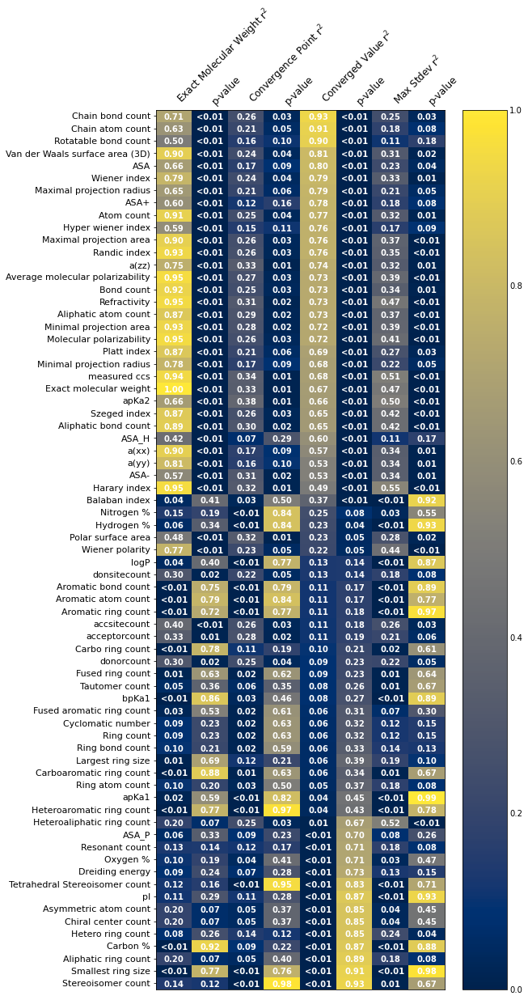

In [7]:
# Comment/uncomment to change which Monte Carlo convergence "property" to sort by
#dfpearsonr_print = dfpearsonr_print.sort_values(by='Exact Molecular Weight r$^2$')
#dfpearsonr_print = dfpearsonr_print.sort_values(by='Convergence Point r$^2$')
dfpearsonr_print = dfpearsonr_print.sort_values(by='Converged Value r$^2$')
#dfpearsonr_print = dfpearsonr_print.sort_values(by='Max Stdev r$^2$')

fig, ax = plt.subplots(figsize=(8,20))
psm = ax.pcolormesh(dfpearsonr_print.values, cmap=cm.get_cmap('cividis', 70*5), 
                     rasterized=True, vmin=0, vmax=1)
cbar = fig.colorbar(psm, ax=ax)
cbar.ax.tick_params(size=0)
ax.xaxis.tick_top()
ax.tick_params(axis='x', length=0)
plt.yticks(np.arange(0.5, 71.5), dfpearsonr_print.index, fontsize=11)
plt.xticks(np.arange(0.5,8.5), 
           ['Exact Molecular Weight r$^2$', 'p-value',
            'Convergence Point r$^2$', 'p-value',
            'Converged Value r$^2$', 'p-value', 
            'Max Stdev r$^2$', 'p-value'],
           fontsize=12, rotation=45, ha='left')

# Loop over data dimensions and create text annotations.
for i in range(len(dfpearsonr_print.index)):
    for j in range(len(dfpearsonr_print.columns)):
        val = dfpearsonr_print.values[i, j]
        if val < 0.01:
            str_val = '<0.01'
        else:
            str_val = '%.2f' % val
        text = ax.text(j + 0.5, i + 0.4, str_val,
                       ha='center', va='center', color='w', fontweight=700) #, fontstretch=1000)
        

#plt.savefig('property-correlation-heatmap.png', bbox_inches='tight', dpi=600)
plt.show()

In [8]:
CXCALCdf = df.sort_values(by='Exact molecular weight')

Carbon %
RMSD converg value:  0.04211554696368799 0.8682150975022226
RMSD converg sample size:  -0.3028809660698562 0.22181549041504703
RMSD max stdev:  -0.037184242327484296 0.8835397732209884


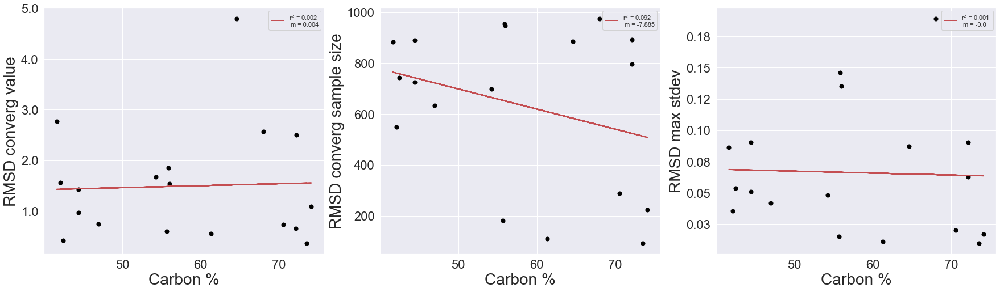

Hydrogen %
RMSD converg value:  0.48467431686666207 0.04150140202741079
RMSD converg sample size:  0.05083188820717511 0.841240126232979
RMSD max stdev:  -0.021473568498729164 0.9326006535137571


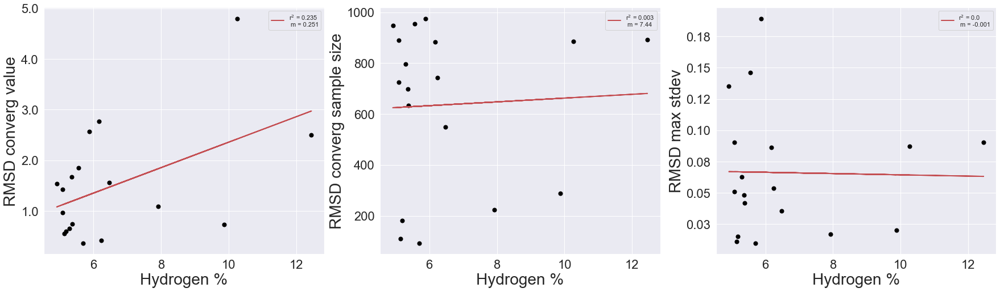

Nitrogen %
RMSD converg value:  -0.4971712841734228 0.08388642899498183
RMSD converg sample size:  0.061868906951542214 0.8408666192900188
RMSD max stdev:  -0.18446298237891195 0.5463156786966532


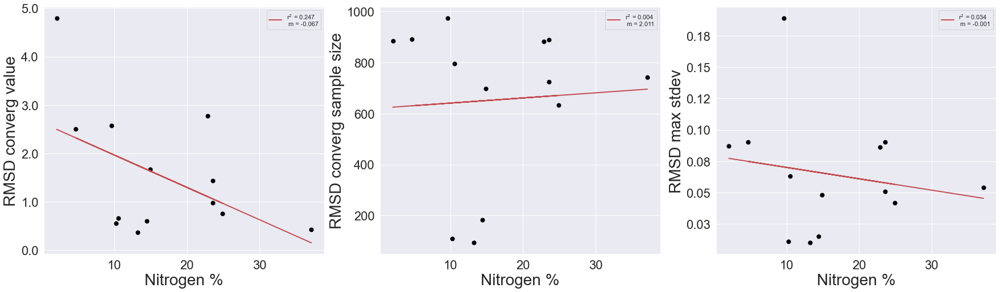

Oxygen %
RMSD converg value:  0.09438268692374645 0.7095074582518892
RMSD converg sample size:  0.2049687915522595 0.41455983196298285
RMSD max stdev:  0.18138214260470145 0.47133918192376567


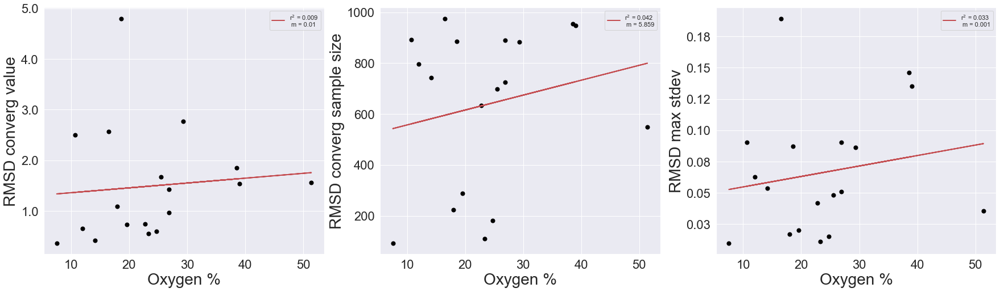

Exact molecular weight
RMSD converg value:  0.8155218895686401 3.713291370355282e-05
RMSD converg sample size:  0.5758824884813616 0.012381674401488671
RMSD max stdev:  0.6869116197117325 0.0016378318645387155


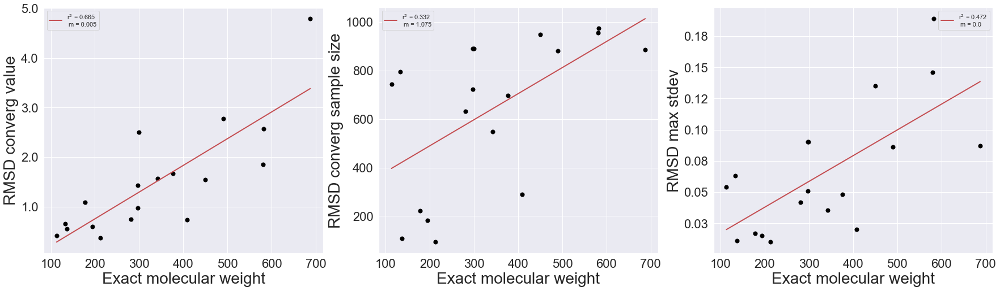

Molecular polarizability
RMSD converg value:  0.8472147327305111 9.137549408622437e-06
RMSD converg sample size:  0.507498969467707 0.031562890455068444
RMSD max stdev:  0.6435730548018651 0.003953994588734748


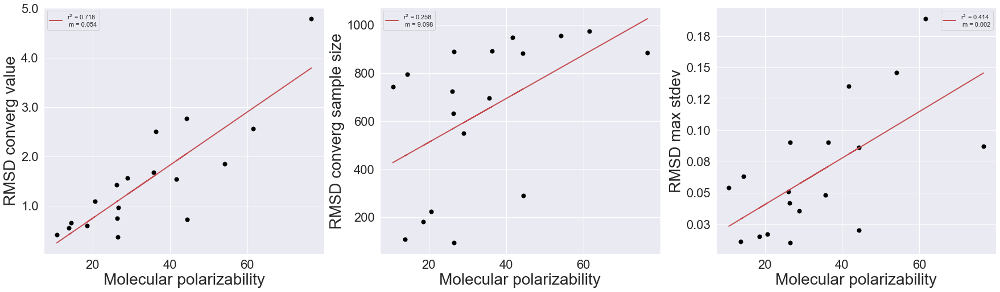

Average molecular polarizability
RMSD converg value:  0.8561308786712066 5.817557794026947e-06
RMSD converg sample size:  0.517640291180587 0.02778869276431525
RMSD max stdev:  0.6285918159317107 0.005204560020349916


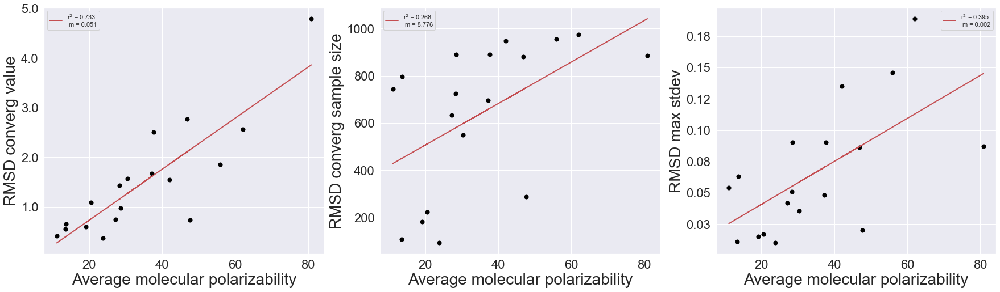

a(xx)
RMSD converg value:  0.7383430513037348 0.0004670899433463062
RMSD converg sample size:  0.4362643822228048 0.07030103008851117
RMSD max stdev:  0.610563779856456 0.007117517568515771


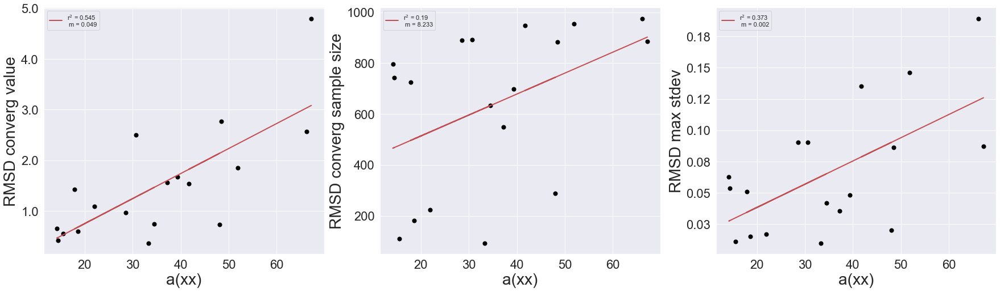

a(yy)
RMSD converg value:  0.73848790225004 0.0004652597394871769
RMSD converg sample size:  0.3859818995366351 0.11363896727349633
RMSD max stdev:  0.5653223990240187 0.014488205102613519


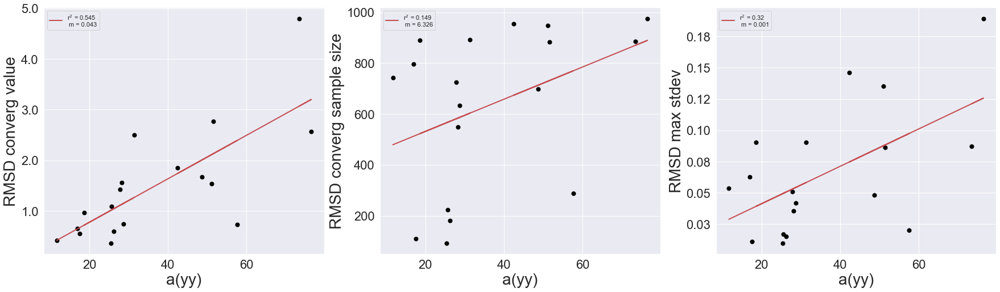

a(zz)
RMSD converg value:  0.8594993760032729 4.86695561942016e-06
RMSD converg sample size:  0.5735837859304694 0.012817979992461209
RMSD max stdev:  0.5666448075142887 0.014209823394608223


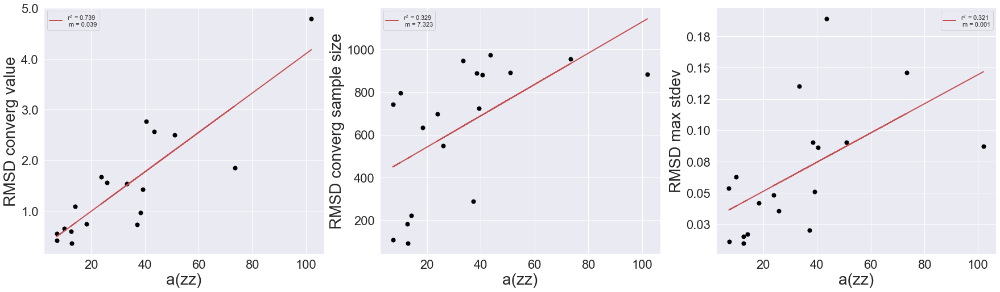

ASA
RMSD converg value:  0.8927977376737739 6.235193263797861e-07
RMSD converg sample size:  0.41463415040616297 0.08710762656277293
RMSD max stdev:  0.4879222368645315 0.03995773933201661


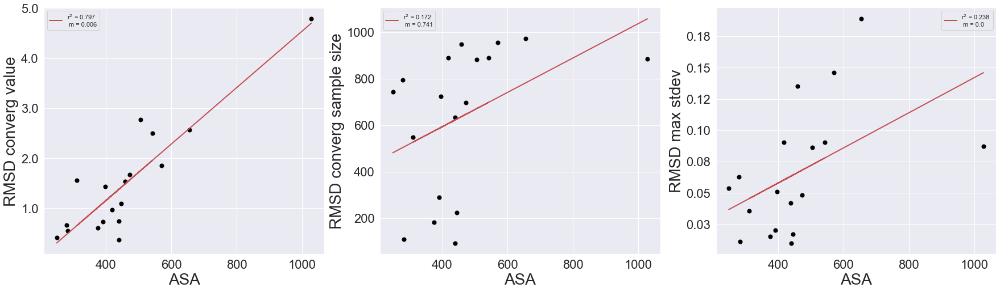

ASA+
RMSD converg value:  0.8790417906635366 1.5660532951456342e-06
RMSD converg sample size:  0.34521130724620824 0.16060611094758165
RMSD max stdev:  0.42395457640314754 0.07954111602936646


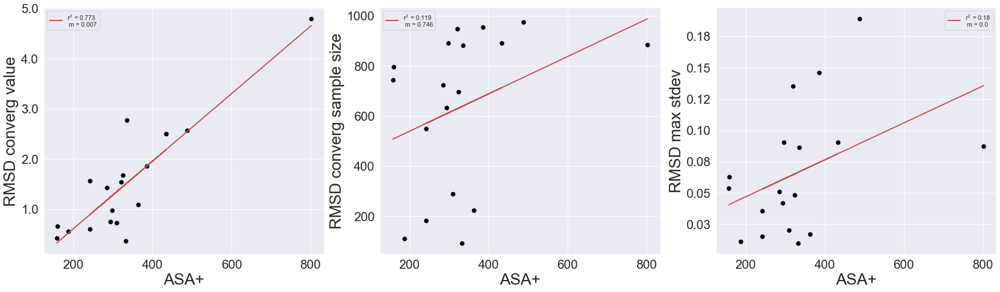

ASA-
RMSD converg value:  0.7199408790639964 0.0007544331412899904
RMSD converg sample size:  0.5610933580519735 0.01540766240883664
RMSD max stdev:  0.5965286823484497 0.008970252404872415


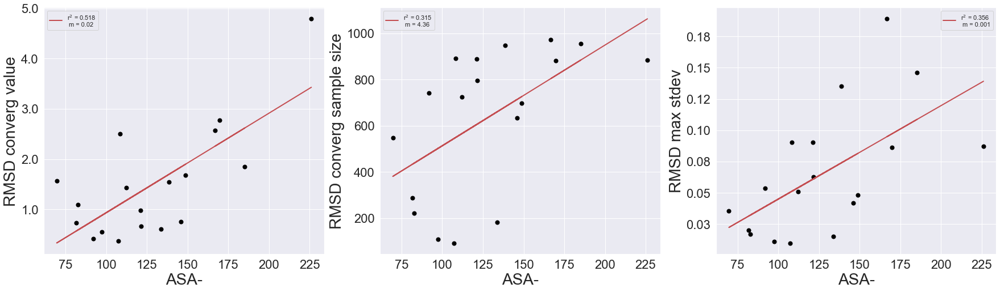

ASA_H
RMSD converg value:  0.7780145510814395 0.0001437340291455104
RMSD converg sample size:  0.26166045695642226 0.2942478573462786
RMSD max stdev:  0.33261724373346535 0.17745160012403285


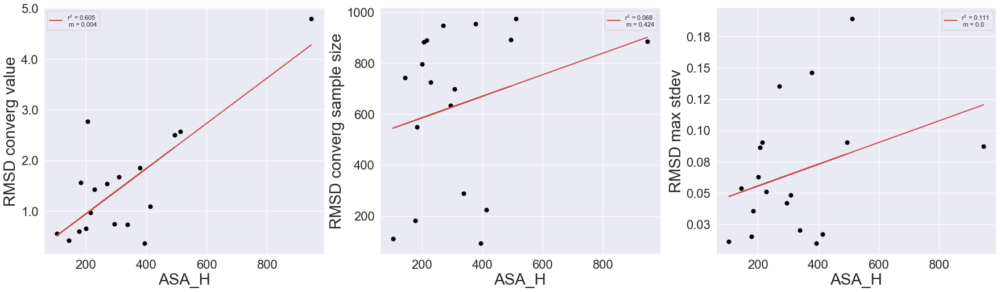

ASA_P
RMSD converg value:  0.0866141326324354 0.7325507443479016
RMSD converg sample size:  0.31434515263770957 0.2039383322215776
RMSD max stdev:  0.30195257218821486 0.22330613119531384


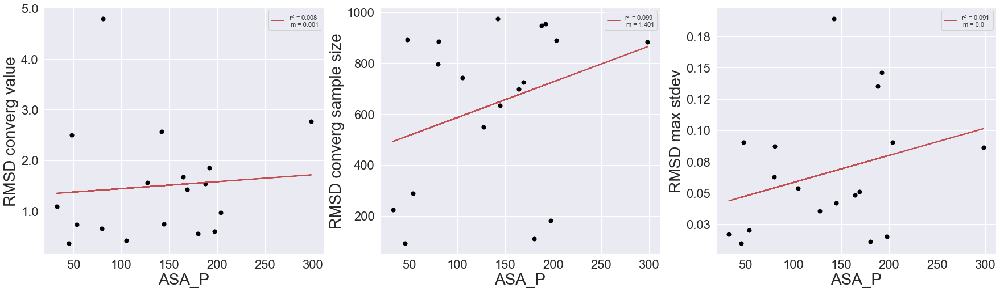

Asymmetric atom count
RMSD converg value:  0.04911164046489176 0.8465515114425349
RMSD converg sample size:  0.22259901645093993 0.3746367103499004
RMSD max stdev:  0.18822578167939644 0.45447914464969963


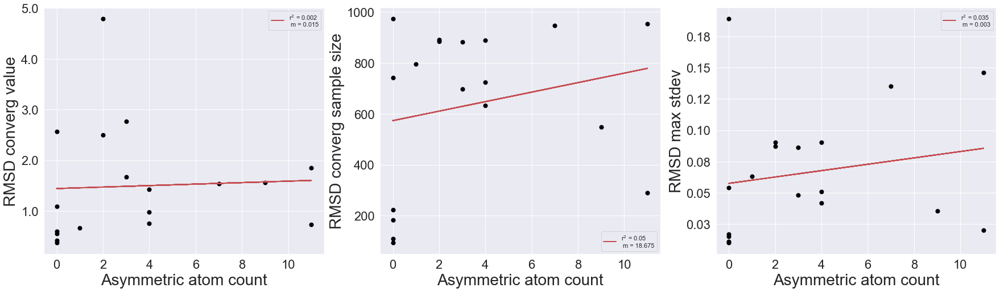

Balaban index
RMSD converg value:  0.6051463735282684 0.00779194561564365
RMSD converg sample size:  0.16876559971902585 0.5032174527635641
RMSD max stdev:  -0.027275385848643884 0.9144468556115021


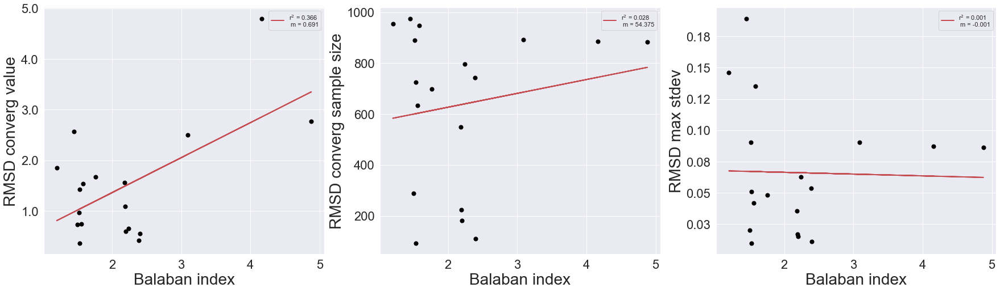

Carboaromatic ring count
RMSD converg value:  -0.23740842424759406 0.3428312042725074
RMSD converg sample size:  -0.12234254443363995 0.6286588194423005
RMSD max stdev:  0.10679971584965317 0.6731759145005949


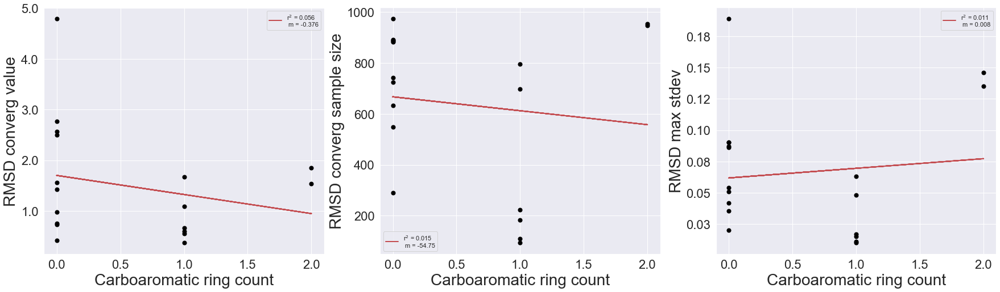

Carbo ring count
RMSD converg value:  -0.30871479201822793 0.21259598560970158
RMSD converg sample size:  -0.32605924248115814 0.18667665595304725
RMSD max stdev:  -0.13044570014758514 0.6059130499870264


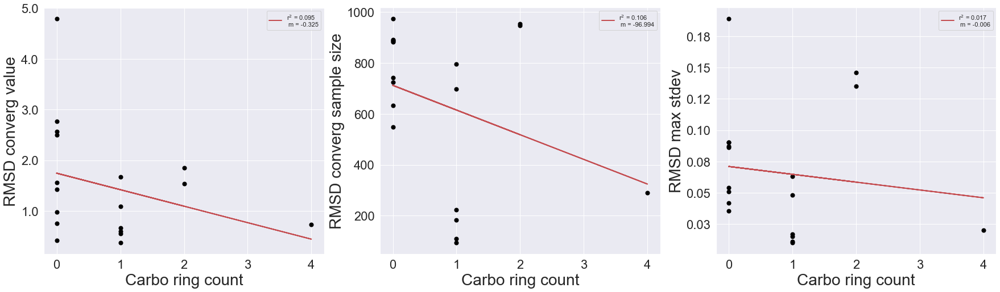

Chiral center count
RMSD converg value:  0.04911164046489176 0.8465515114425349
RMSD converg sample size:  0.22259901645093993 0.3746367103499004
RMSD max stdev:  0.18822578167939644 0.45447914464969963


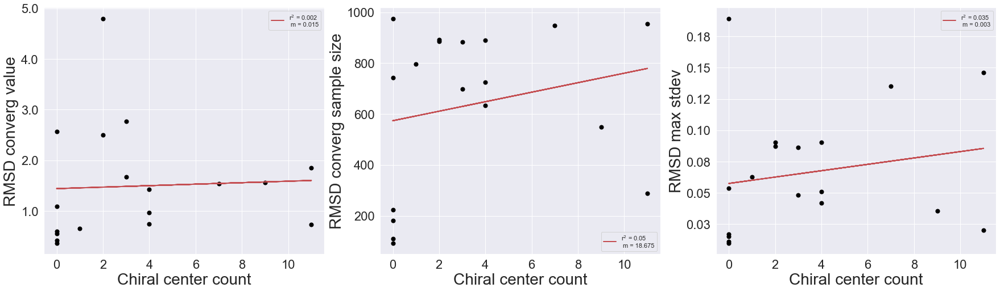

Cyclomatic number
RMSD converg value:  -0.24973523028347405 0.3175888881787137
RMSD converg sample size:  0.1232031531484803 0.6262274444136646
RMSD max stdev:  0.3525581298636381 0.1513002290654903


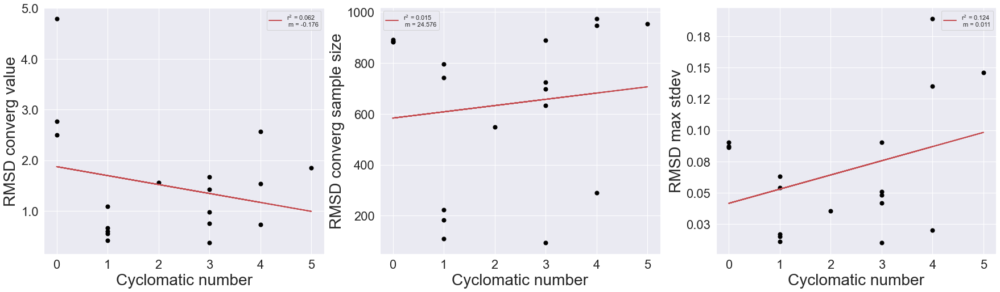

Dreiding energy
RMSD converg value:  0.09010437773854174 0.7221696360116827
RMSD converg sample size:  0.26863420638971697 0.2810933869900126
RMSD max stdev:  0.35500296907596945 0.14828744356648363


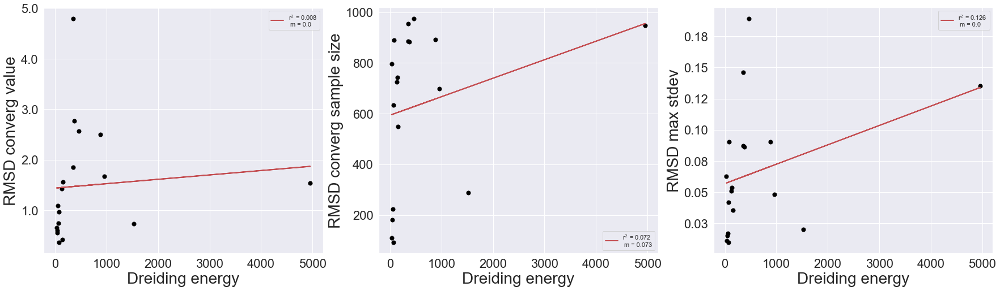

Fused aromatic ring count
RMSD converg value:  -0.2526461229514691 0.31179316611800145
RMSD converg sample size:  -0.12754871868882267 0.6140067945832133
RMSD max stdev:  -0.2580993164567897 0.3011063187978853


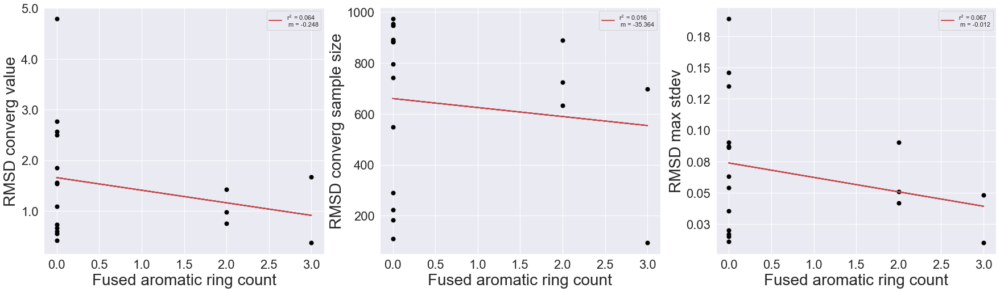

Fused ring count
RMSD converg value:  -0.2956405455045951 0.23361202245688223
RMSD converg sample size:  -0.12422400362887434 0.6233481074373031
RMSD max stdev:  -0.11872171654751026 0.6389279517224833


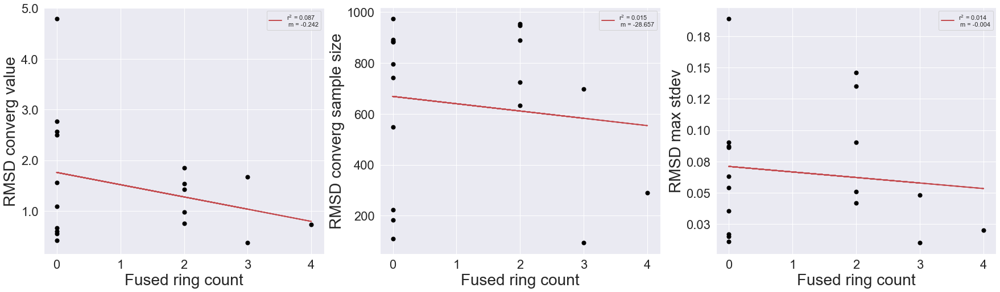

Harary index
RMSD converg value:  0.6998726442912421 0.0012228091185095419
RMSD converg sample size:  0.5631489774679264 0.014955130611292488
RMSD max stdev:  0.7433917192318237 0.0004067500672210538


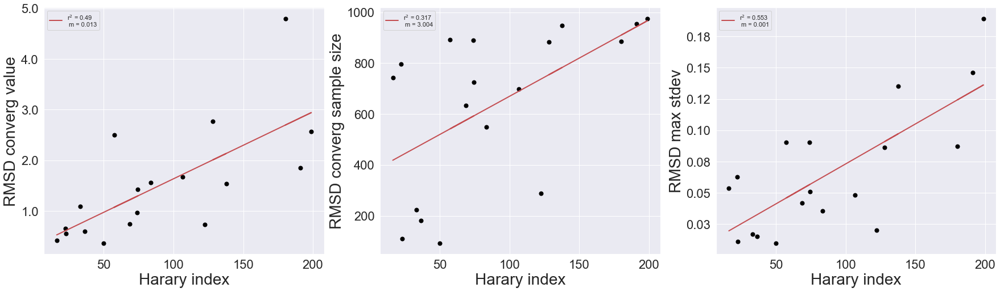

Hyper wiener index
RMSD converg value:  0.8739909856050535 2.136732134557987e-06
RMSD converg sample size:  0.38978090104242546 0.10982647977046772
RMSD max stdev:  0.40734216332998435 0.09338271108147302


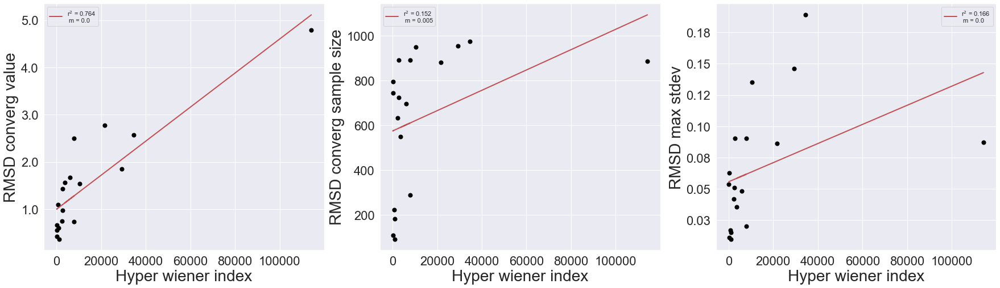

Maximal projection area
RMSD converg value:  0.874911860172583 2.0210528340753044e-06
RMSD converg sample size:  0.5046582876777354 0.032687982461742496
RMSD max stdev:  0.6037141138795767 0.007978606204029194


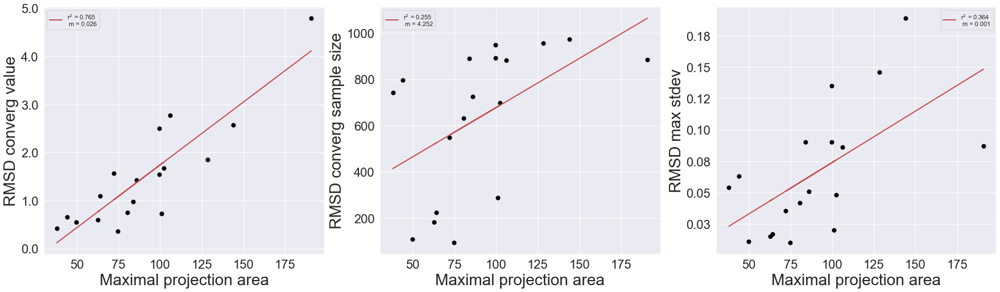

Maximal projection radius
RMSD converg value:  0.8850828886090958 1.0601728785924321e-06
RMSD converg sample size:  0.4554474023220292 0.05751900586402891
RMSD max stdev:  0.4643537225640746 0.05221562939551127


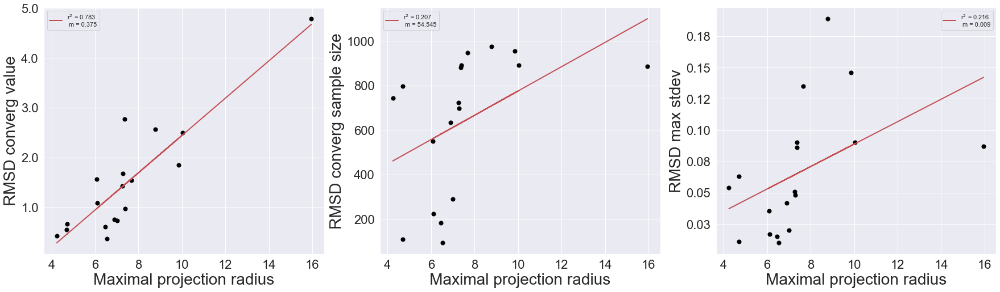

Minimal projection area
RMSD converg value:  0.8430548861536775 1.1172781598167558e-05
RMSD converg sample size:  0.5380606887131387 0.021258327418319477
RMSD max stdev:  0.6330327464185024 0.0048043309592687095


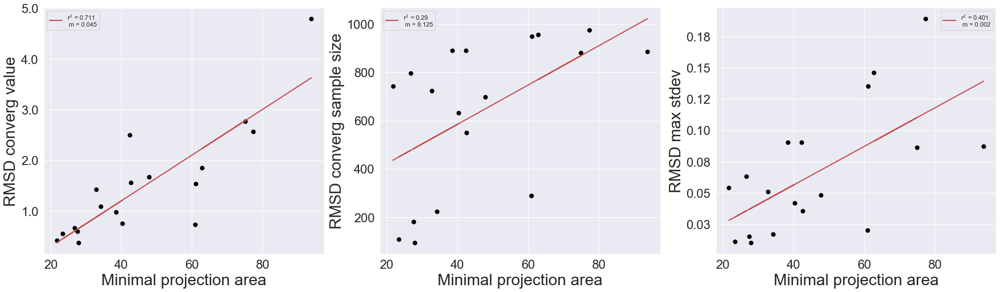

Minimal projection radius
RMSD converg value:  0.8180723810566002 3.3505246130654187e-05
RMSD converg sample size:  0.4196889367567474 0.08294175107166868
RMSD max stdev:  0.4777812080174582 0.044928012267756855


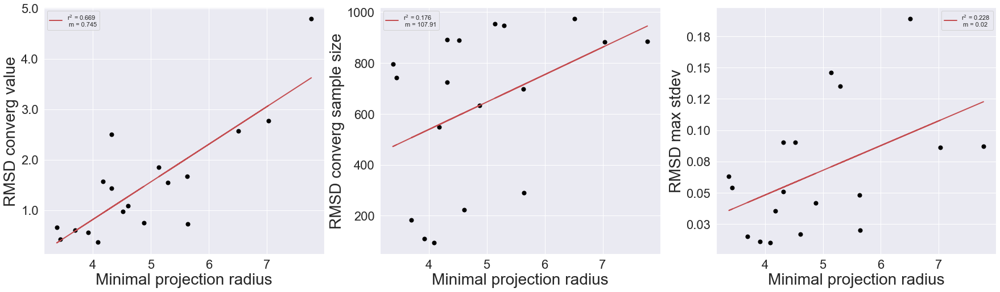

Van der Waals surface area (3D)
RMSD converg value:  0.8969996833232772 4.5904894978520835e-07
RMSD converg sample size:  0.49417570802850086 0.03710966188711416
RMSD max stdev:  0.5575046567924419 0.016223664197871836


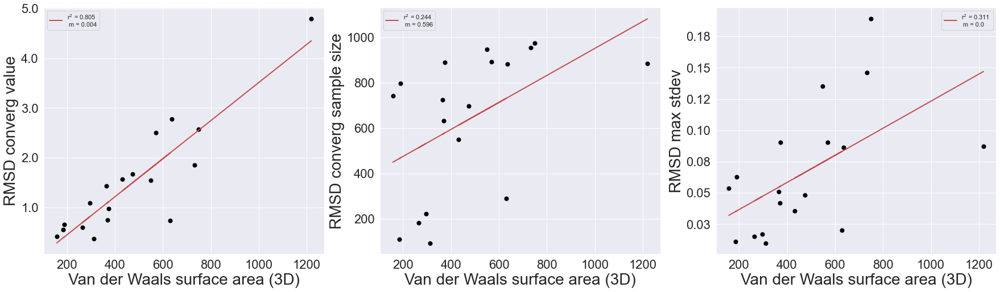

Platt index
RMSD converg value:  0.8294236246927557 2.0787224369330355e-05
RMSD converg sample size:  0.4584553159212463 0.05568467901959095
RMSD max stdev:  0.5211520380981782 0.026566993523431306


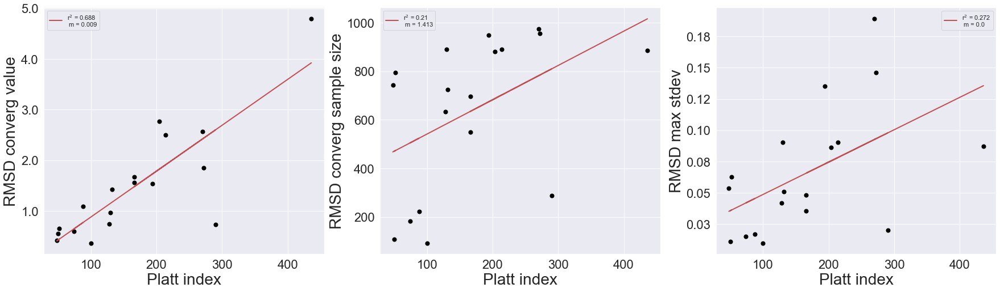

Polar surface area
RMSD converg value:  0.4740188797488564 0.04688678667038931
RMSD converg sample size:  0.5680654385376825 0.013915519338692397
RMSD max stdev:  0.5310189931520737 0.023357206648977526


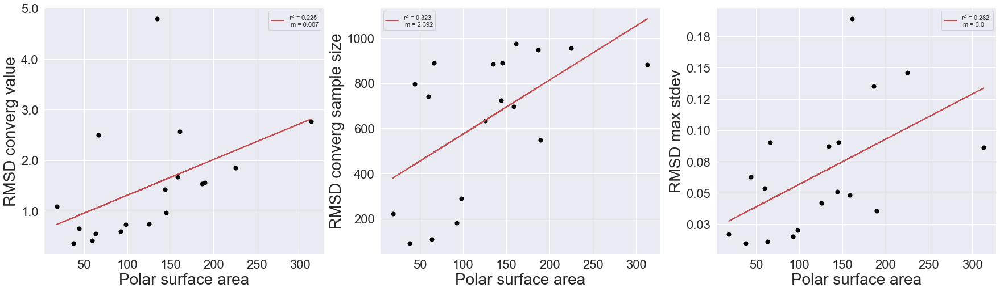

Randic index
RMSD converg value:  0.871804462566486 2.4344704221361904e-06
RMSD converg sample size:  0.5132152961279037 0.029389762322879404
RMSD max stdev:  0.5921627248706058 0.009619648391542557


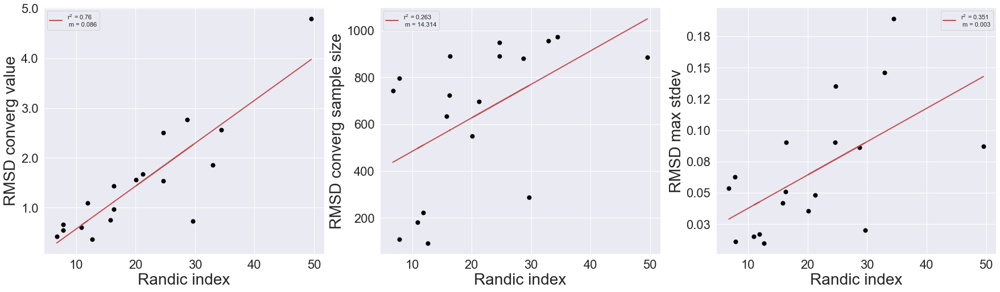

Szeged index
RMSD converg value:  0.808285492603787 4.930072589132191e-05
RMSD converg sample size:  0.5139336023983715 0.02912511347257664
RMSD max stdev:  0.6488728444882829 0.0035754663394014963


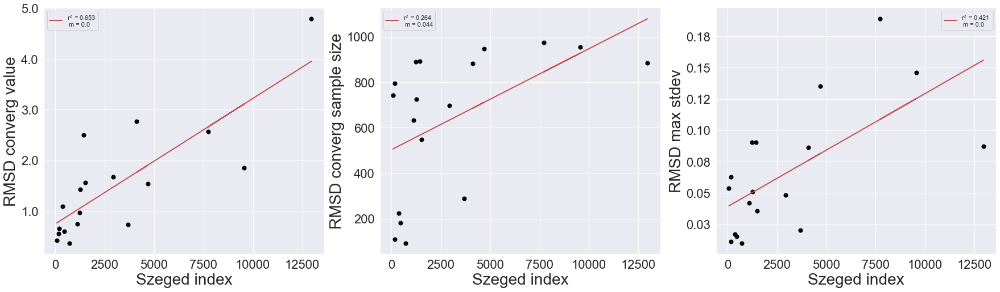

Atom count
RMSD converg value:  0.8779737421851054 1.674293912391625e-06
RMSD converg sample size:  0.496256567433109 0.036197374615461714
RMSD max stdev:  0.5653031485388842 0.014492289296308667


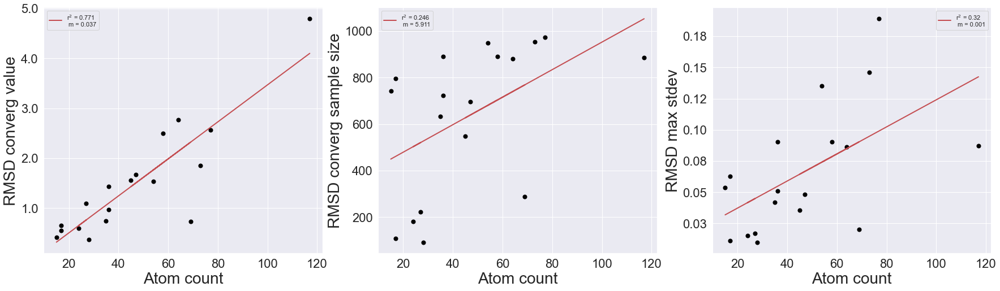

Aliphatic atom count
RMSD converg value:  0.8531885104571296 6.77414402316335e-06
RMSD converg sample size:  0.5394613435654755 0.02085908862150754
RMSD max stdev:  0.6120633996749889 0.0069394186184443965


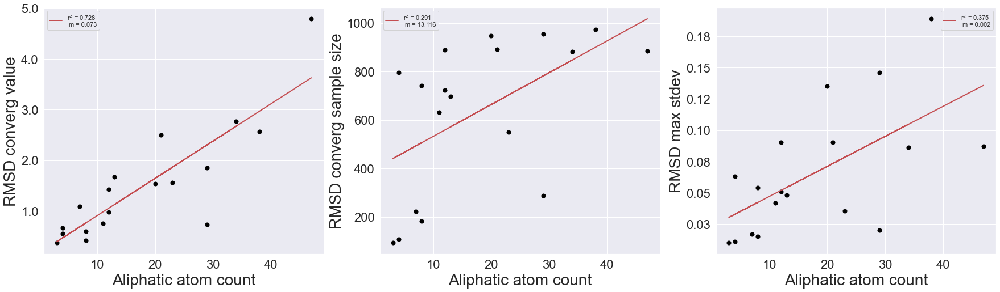

Aromatic atom count
RMSD converg value:  -0.3350348195784653 0.17412954007736473
RMSD converg sample size:  -0.051429150630789816 0.8393975495434445
RMSD max stdev:  0.07556912305150303 0.765686665275285


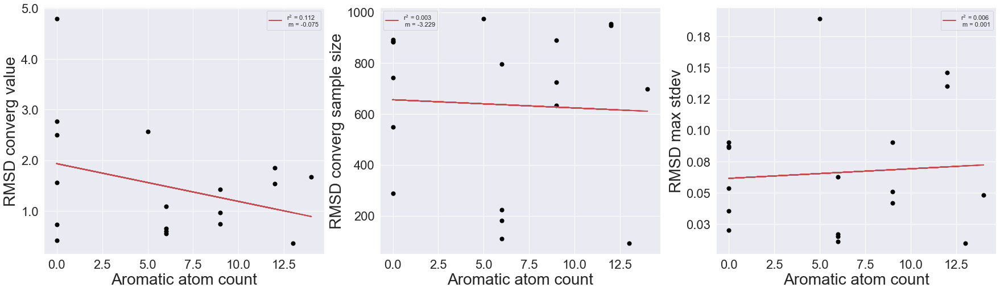

Bond count
RMSD converg value:  0.8555997506364735 5.981100452240019e-06
RMSD converg sample size:  0.4992587881576982 0.03491163150440381
RMSD max stdev:  0.5812848927272106 0.011402828489765036


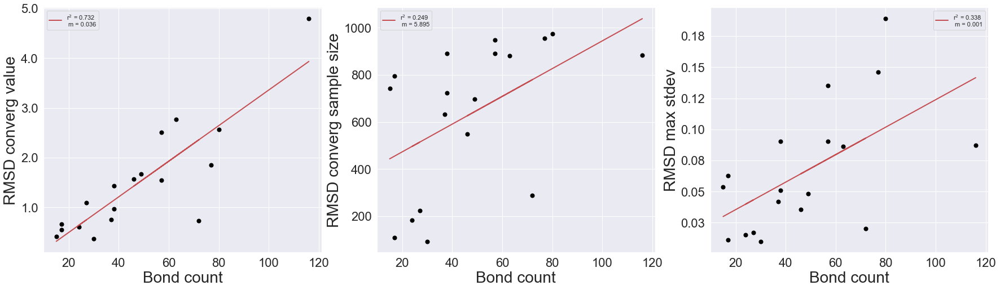

Aliphatic bond count
RMSD converg value:  0.8076171981016765 5.0578280781757134e-05
RMSD converg sample size:  0.5445877400296173 0.019447842167993414
RMSD max stdev:  0.6471346675177463 0.0036961910902378802


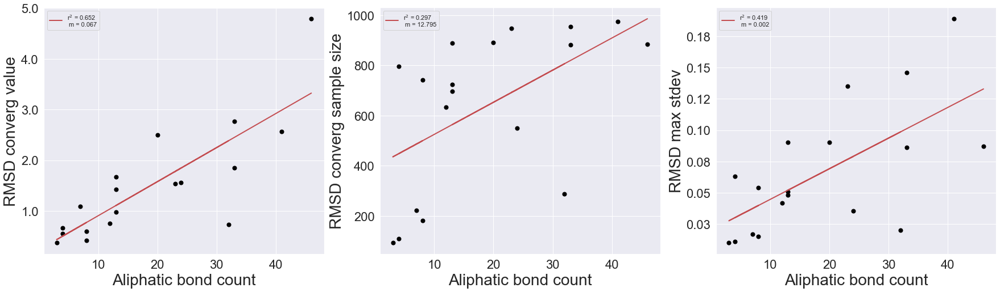

Aromatic bond count
RMSD converg value:  -0.3360384749417843 0.17276278322899324
RMSD converg sample size:  -0.06824542152476473 0.7878776481360976
RMSD max stdev:  0.03445176441196527 0.8920486200683109


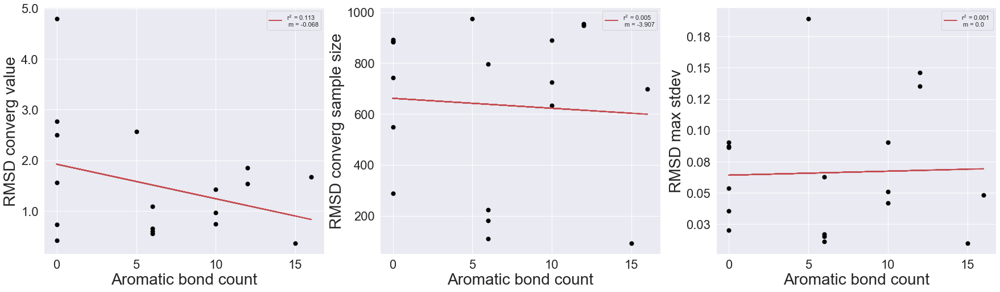

Rotatable bond count
RMSD converg value:  0.9464334344377189 2.879426110297621e-09
RMSD converg sample size:  0.3988259445571611 0.10111793030844195
RMSD max stdev:  0.3369376519592589 0.17154446514277982


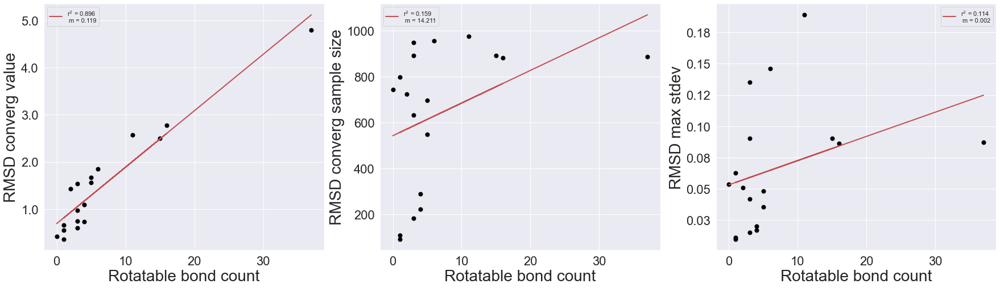

Ring count
RMSD converg value:  -0.24973523028347405 0.3175888881787137
RMSD converg sample size:  0.1232031531484803 0.6262274444136646
RMSD max stdev:  0.3525581298636381 0.1513002290654903


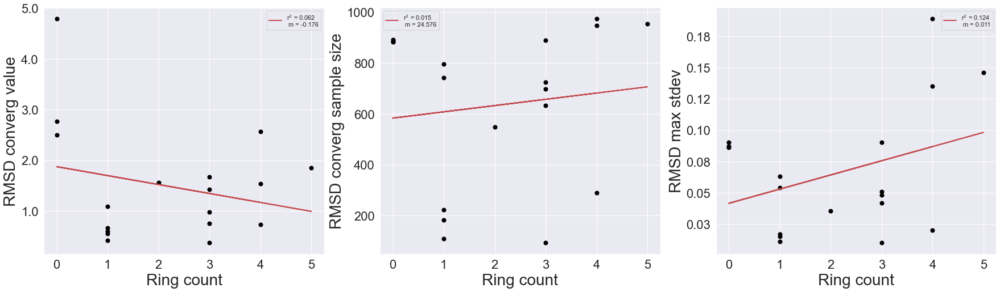

Aliphatic ring count
RMSD converg value:  -0.036031468121507544 0.88712804799824
RMSD converg sample size:  0.21275016455331833 0.3966672210339316
RMSD max stdev:  0.426644088309872 0.07745023055852349


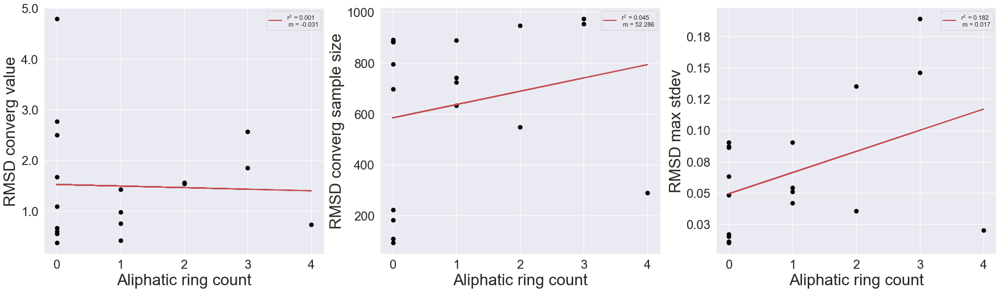

Aromatic ring count
RMSD converg value:  -0.3341919449130305 0.17528296269820373
RMSD converg sample size:  -0.07499873609617076 0.7674089661778529
RMSD max stdev:  0.009488015136913148 0.9701940651078593


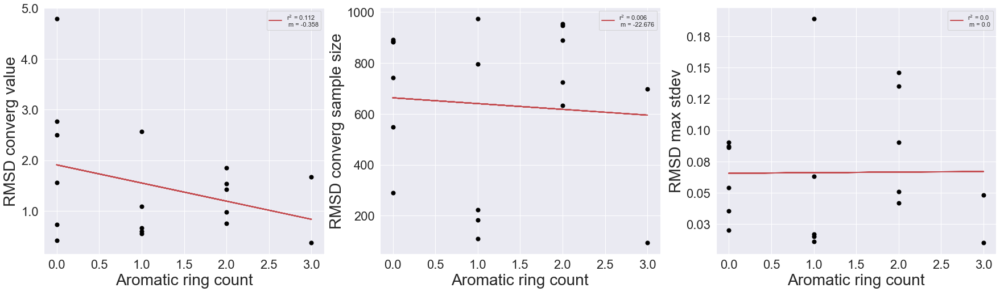

Hetero ring count
RMSD converg value:  -0.047566556983376806 0.8513274423068734
RMSD converg sample size:  0.38064915605242455 0.119147908750231
RMSD max stdev:  0.4899732631273062 0.039005804896150076


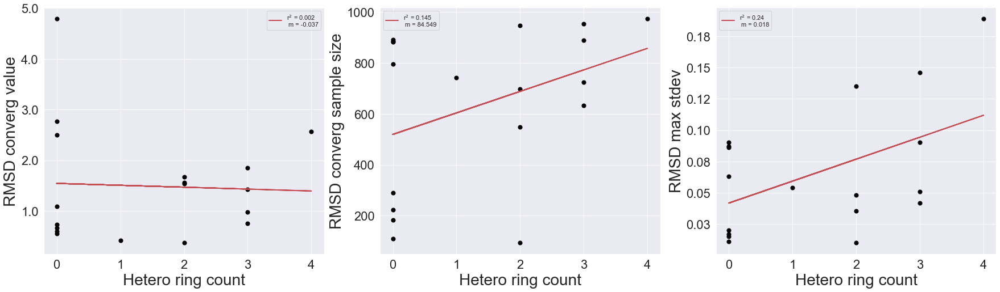

Heteroaliphatic ring count
RMSD converg value:  0.10729006850589129 0.6717545970565268
RMSD converg sample size:  0.5022520178193851 0.03366502094975909
RMSD max stdev:  0.7178567177764408 0.0007947018726240602


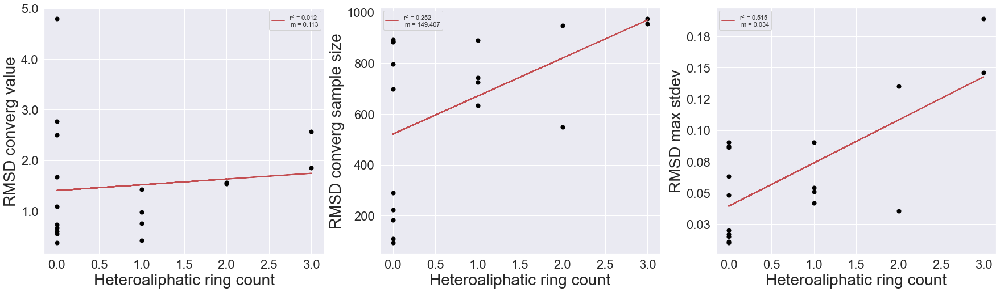

Heteroaromatic ring count
RMSD converg value:  -0.19783043225991978 0.4313451433737501
RMSD converg sample size:  0.008716846683407867 0.9726157398457236
RMSD max stdev:  -0.07133426723529593 0.7784983711788012


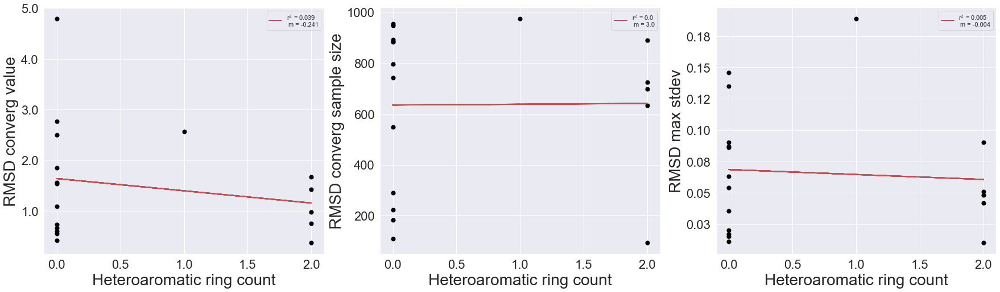

Ring atom count
RMSD converg value:  -0.22371786549642436 0.37217806353975974
RMSD converg sample size:  0.16979678278788649 0.500574038398948
RMSD max stdev:  0.4211368315382292 0.08177577430189803


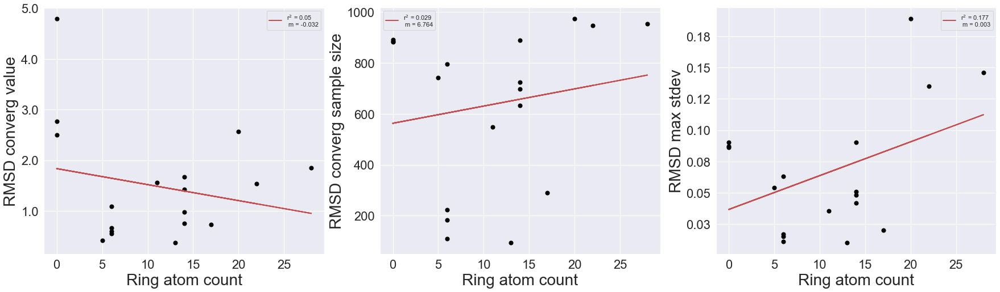

Ring bond count
RMSD converg value:  -0.24134526573642015 0.33464701165284017
RMSD converg sample size:  0.13611815803809207 0.5901915460446607
RMSD max stdev:  0.3738217608337465 0.12647297901727125


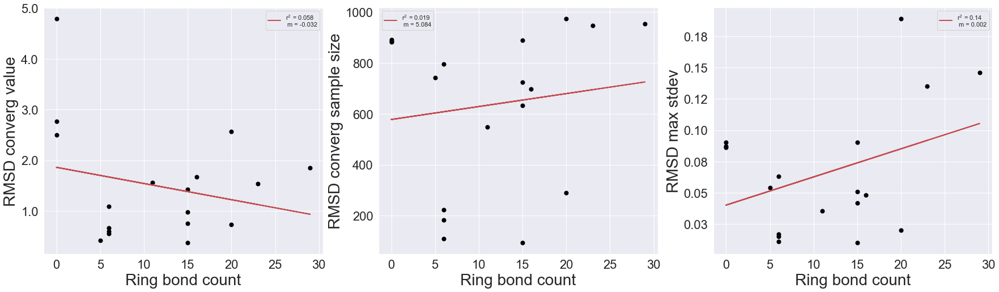

Chain atom count
RMSD converg value:  0.9558437725220356 6.325077180268486e-10
RMSD converg sample size:  0.4622607288705689 0.05342739493542819
RMSD max stdev:  0.42710780811411403 0.07709384646018755


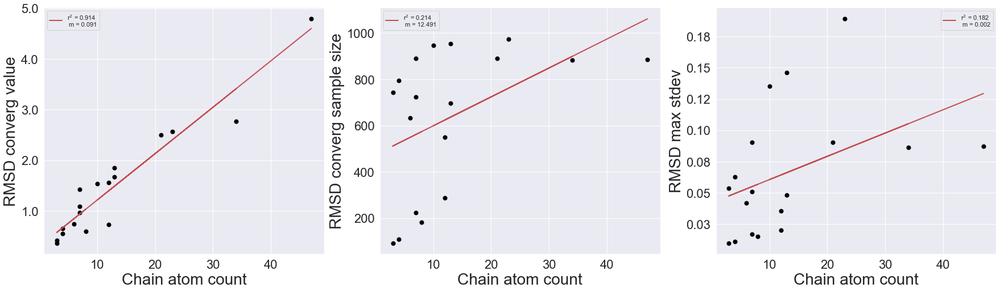

Chain bond count
RMSD converg value:  0.9645440845304587 1.1235443986661932e-10
RMSD converg sample size:  0.5059664869407027 0.032166069588305486
RMSD max stdev:  0.5002798572308794 0.034482452675062614


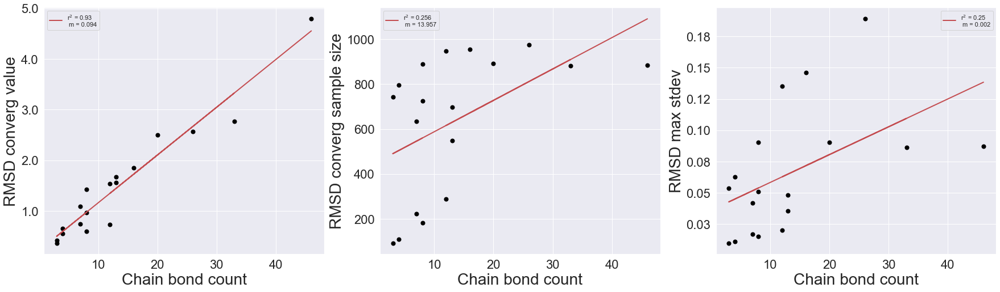

Smallest ring size
RMSD converg value:  0.031587233257149606 0.911021390797837
RMSD converg sample size:  -0.08501562843148659 0.7632280485711282
RMSD max stdev:  0.007145315434932846 0.9798372922314099


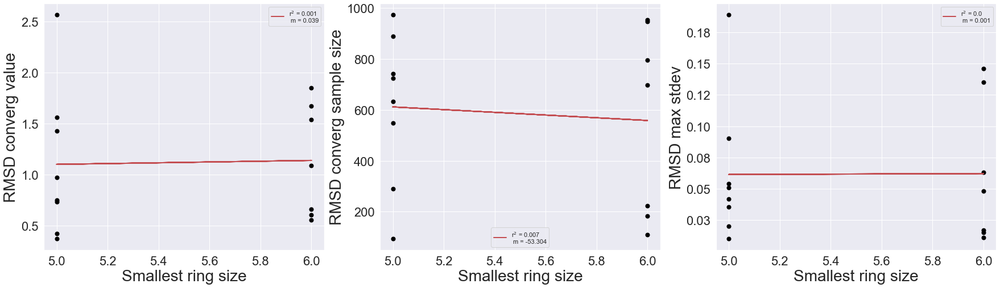

Largest ring size
RMSD converg value:  -0.2410592029990681 0.38676953506592937
RMSD converg sample size:  -0.3404496265696437 0.21435668223627688
RMSD max stdev:  -0.44145505331550544 0.09949006700866676


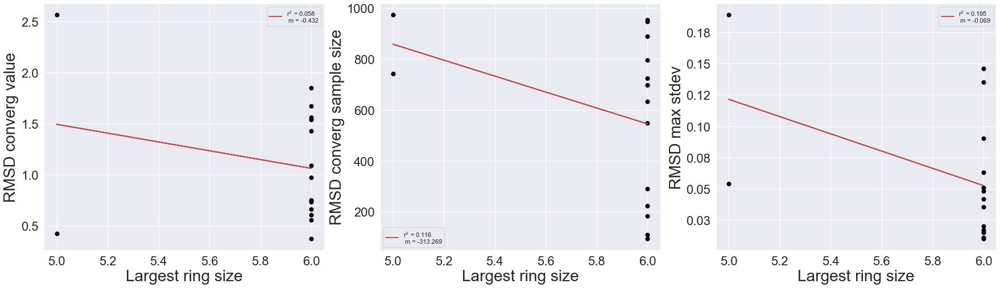

Wiener index
RMSD converg value:  0.8904417188546059 7.362904943686324e-07
RMSD converg sample size:  0.48673178651381876 0.04051834758144555
RMSD max stdev:  0.5715793250146888 0.013208360927890852


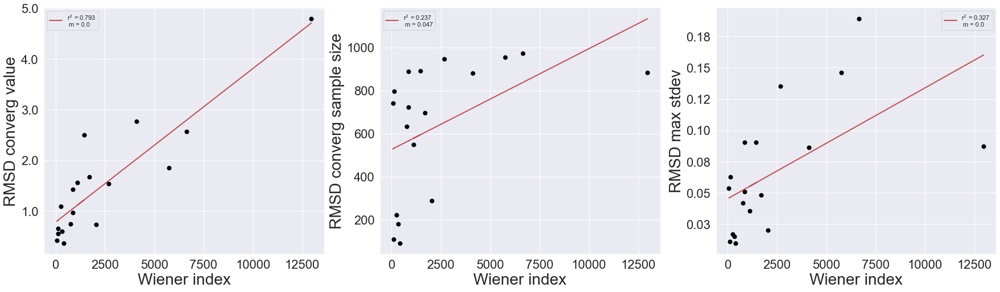

Wiener polarity
RMSD converg value:  0.47201528109988433 0.04795599615903079
RMSD converg sample size:  0.47321052571337036 0.04731596186286754
RMSD max stdev:  0.6561008901703392 0.0031075307100376518


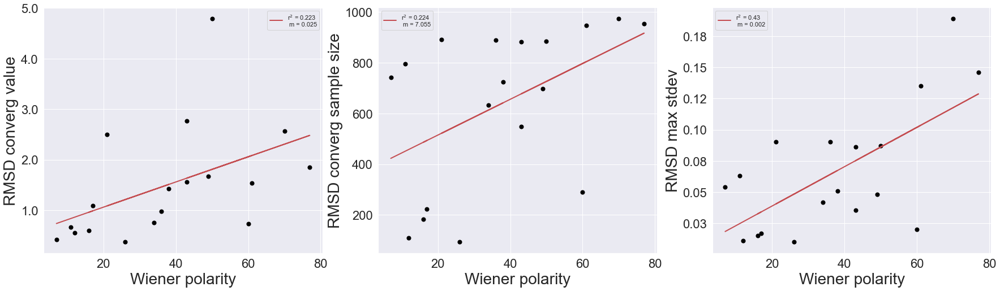

Stereoisomer count
RMSD converg value:  -0.023750766944143045 0.9254710831496358
RMSD converg sample size:  0.005454717749703842 0.9828619765992316
RMSD max stdev:  0.10696103861719898 0.6727081939038785


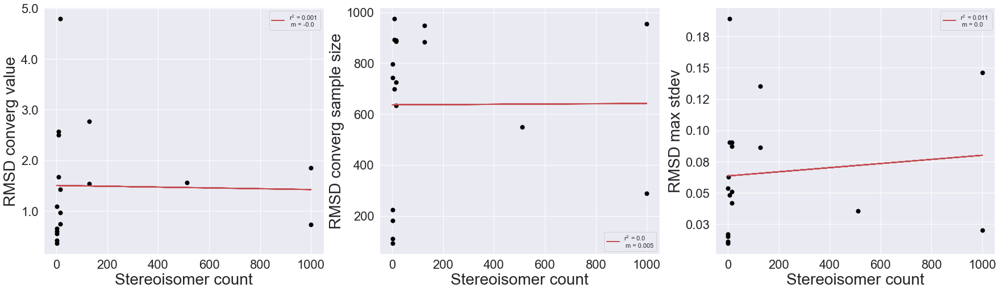

Tautomer count
RMSD converg value:  0.2664354568792424 0.28520131111173
RMSD converg sample size:  0.25198725366934754 0.3130994597950126
RMSD max stdev:  0.13323566202441398 0.5981593605329616


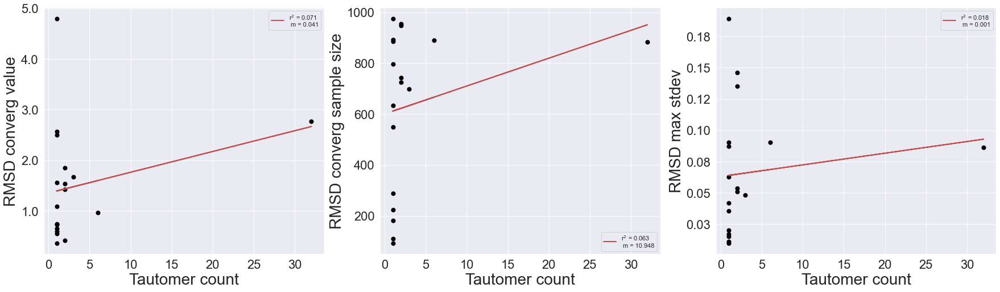

Tetrahedral Stereoisomer count
RMSD converg value:  -0.05610064419856471 0.825013920298668
RMSD converg sample size:  -0.014711284400855496 0.9537991560933783
RMSD max stdev:  0.09344085865545088 0.7122888336271751


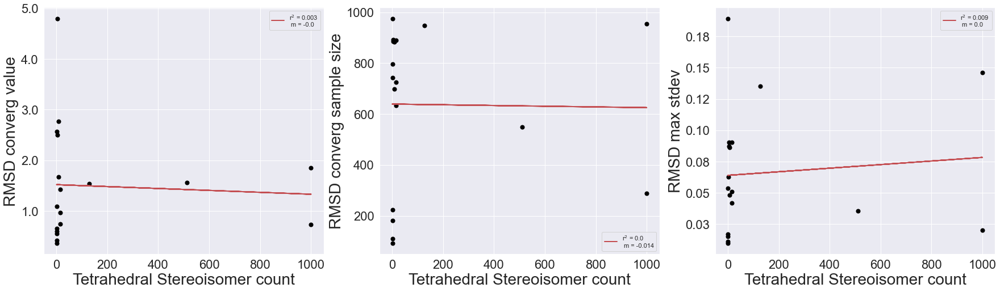

logP
RMSD converg value:  0.37538881231003307 0.12476442755389017
RMSD converg sample size:  -0.08588289620952737 0.7347313509922937
RMSD max stdev:  0.025228647826292725 0.9208469144521128


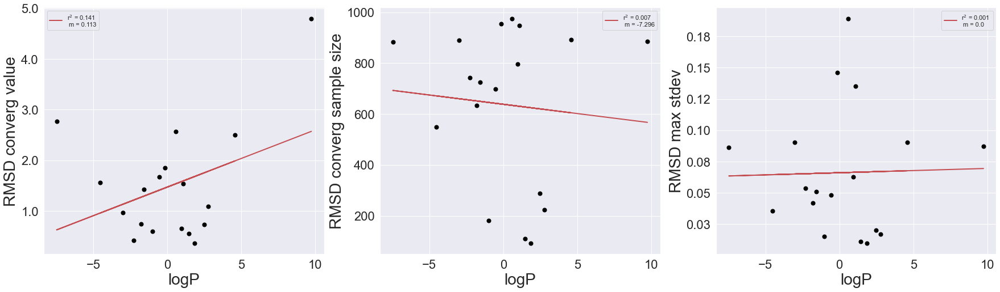

pI
RMSD converg value:  -0.05721800593323926 0.8598029188057359
RMSD converg sample size:  0.3444793415128219 0.2728544765528478
RMSD max stdev:  0.039640626868008545 0.9026509965489508


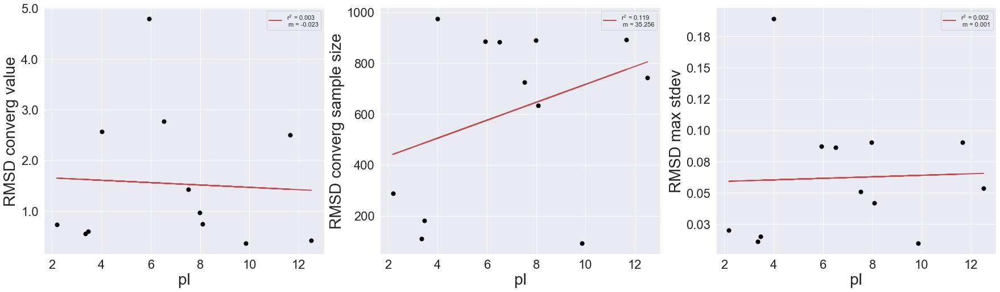

acceptorcount
RMSD converg value:  0.3208172139513994 0.19427640088290646
RMSD converg sample size:  0.5373890624671189 0.021451880919145242
RMSD max stdev:  0.4677246691085337 0.05030769361787002


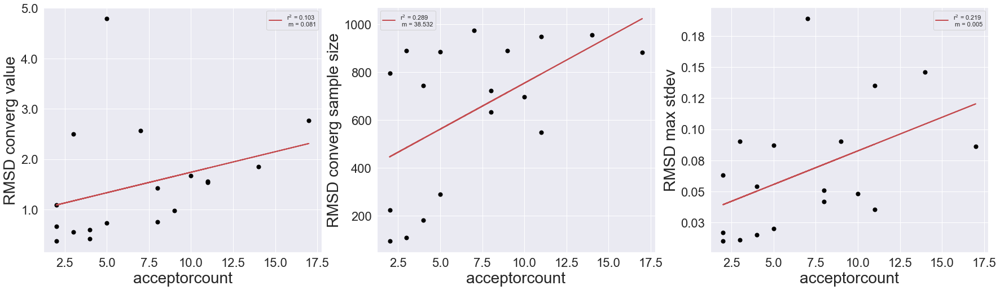

donorcount
RMSD converg value:  0.2975797283578553 0.230414039460025
RMSD converg sample size:  0.49622331803555797 0.036211814948115956
RMSD max stdev:  0.46417007167186525 0.05232111926237336


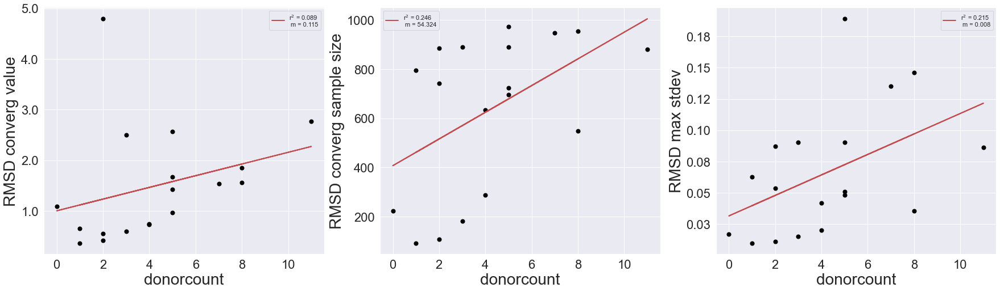

accsitecount
RMSD converg value:  0.32600020586251693 0.18676112509683207
RMSD converg sample size:  0.5158938352070224 0.028412295075386975
RMSD max stdev:  0.513738461510878 0.02919682651706706


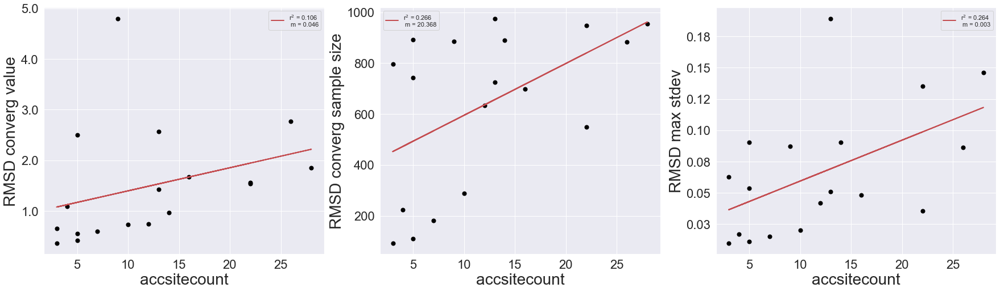

donsitecount
RMSD converg value:  0.3655593720065411 0.13575358108289085
RMSD converg sample size:  0.4659739173509826 0.051291917488644215
RMSD max stdev:  0.4276459265478159 0.07668179693507235


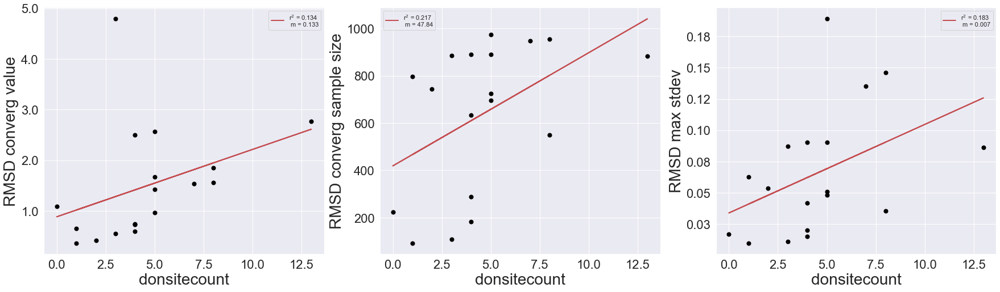

Refractivity
RMSD converg value:  0.8544773493169339 6.339727091139644e-06
RMSD converg sample size:  0.5605614090321319 0.015526518100670227
RMSD max stdev:  0.6847842460186131 0.0017159571339147566


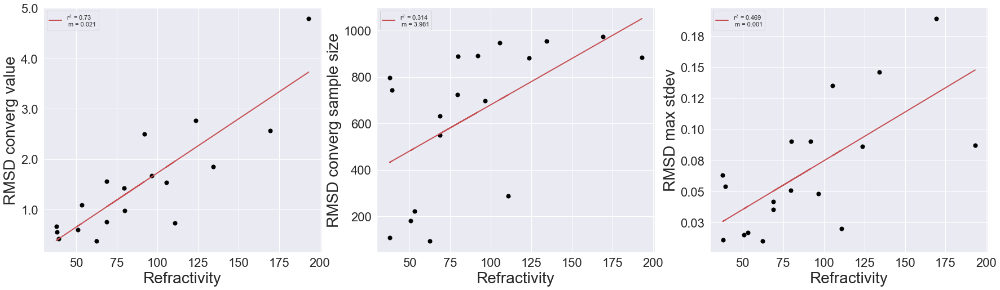

Resonant count
RMSD converg value:  0.09510133265969291 0.7073875240070839
RMSD converg sample size:  0.3401682315359622 0.16721518997881132
RMSD max stdev:  0.4235583873903974 0.07985258406072941


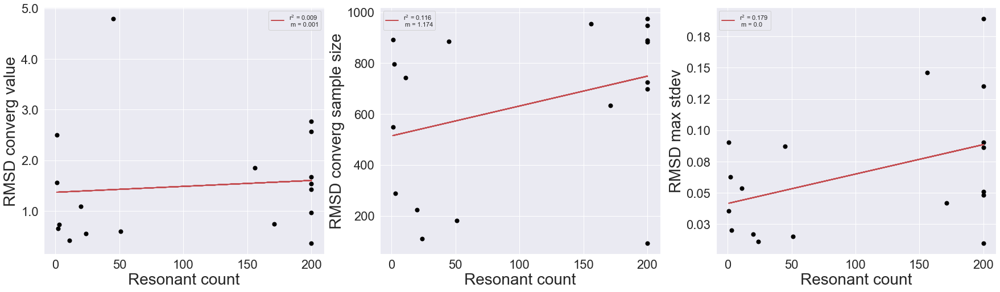

apKa1
RMSD converg value:  -0.12380174266463079 0.6359312063973221
RMSD converg sample size:  -0.15971735313577584 0.5403241654618884
RMSD max stdev:  -0.1423264768876603 0.5858115121027443


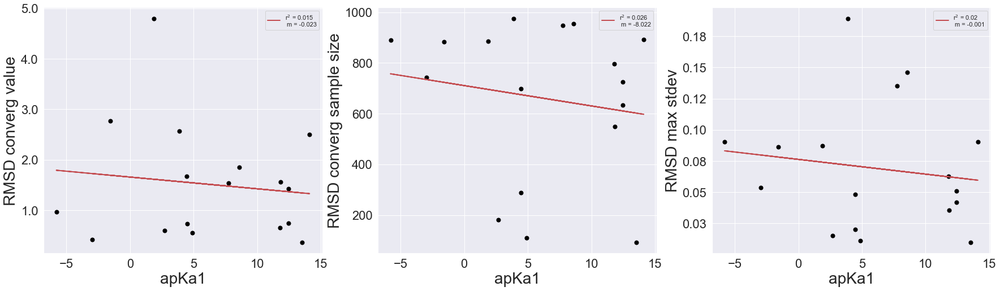

apKa2
RMSD converg value:  -0.7929857355685637 0.00042051722049369
RMSD converg sample size:  -0.6399390748109361 0.010186345040844567
RMSD max stdev:  -0.7358546261109753 0.0017644267647107478


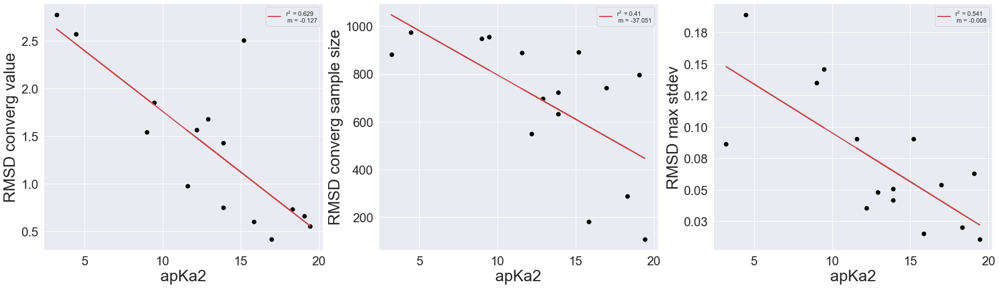

bpKa1
RMSD converg value:  0.2298585917711422 0.3588455749557372
RMSD converg sample size:  0.24354040303430494 0.3301334150076309
RMSD max stdev:  0.12258825331300302 0.6279642751904504


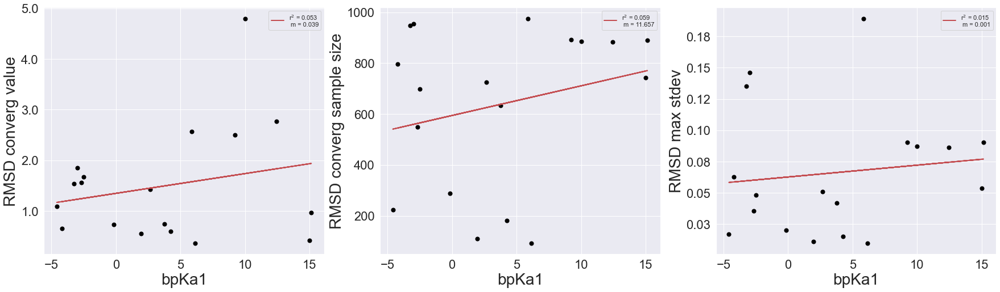

measured ccs
RMSD converg value:  0.8250537532482105 2.5080243946451486e-05
RMSD converg sample size:  0.5812179726319339 0.011414562731252957
RMSD max stdev:  0.7100094236475284 0.0009627888603878732


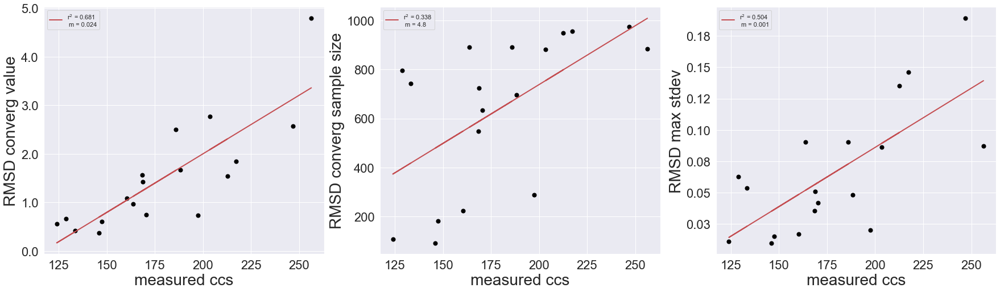

In [9]:
sns.set(style="darkgrid")
pears = []
slopes = []

for xcol in CXCALCdf.columns:
    
    try:
        x = CXCALCdf[xcol].astype(float)
    except:
        continue
    
    ps = []
    #ms = []
    plt.figure(figsize=(30,8))
    
    ####------
    ax1 = plt.subplot(1,3,1)
    ycol = 'RMSD converg value'
    y = MCdf[ycol].astype(float)
    plt.scatter(x, y , s=50, c='black')
    plt.title('', fontsize=27)
    plt.xlabel(xcol, fontsize=28)
    plt.ylabel(ycol, fontsize=28)

    plt.tick_params(axis='both', which='major', labelsize=22)
    ax1.yaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
    
    # Plot the Linear regression line
    x_x = x.values
    y_y = y.values
    mask = ~np.isnan(x_x) & ~np.isnan(y_y)    
    lr = linregress(x_x[mask], y_y[mask])
    m = lr[0]
    r2 = lr[2]**2

    # Linear regression
    x_vals = x_x[mask].reshape(-1, 1)
    y_vals = y_y[mask].reshape(-1, 1)
    linear_regressor = LinearRegression()  # create object for the class
    linear_regressor.fit(x_vals, y_vals)  # perform linear regression
    y_pred = linear_regressor.predict(x_vals)     
    
    plt.plot(x_vals, y_pred, color='r', linestyle='-', linewidth=2,
             label=f'r$^2$ = {np.round(r2, decimals=3)} \n m = {np.round(m, decimals=3)}')
    plt.legend() 
    
 
    # Pearson r
    print(xcol)
    p, pval = pearsonr(x_x[mask], y_y[mask])
    print(f'{ycol}: ', p, pval)
    ps.append(pval)
    ps.append(m)
    
    
    
    ####------
    ax2 = plt.subplot(1,3,2)
    ycol = 'RMSD converg sample size'
    y = MCdf[ycol].astype(float)
    plt.scatter(x, y , s=50, c='black')
    plt.title('', fontsize=27)
    plt.xlabel(xcol, fontsize=28)
    plt.ylabel(ycol, fontsize=28)

    plt.tick_params(axis='both', which='major', labelsize=22)
    ax2.yaxis.set_major_formatter(FormatStrFormatter('%0.0f'))
    
    # Plot the Linear regression line
    x_x = x.values
    y_y = y.values
    mask = ~np.isnan(x_x) & ~np.isnan(y_y)    
    lr = linregress(x_x[mask], y_y[mask])
    m = lr[0]
    r2 = lr[2]**2

    # Linear regression
    x_vals = x_x[mask].reshape(-1, 1)
    y_vals = y_y[mask].reshape(-1, 1)
    linear_regressor = LinearRegression()  # create object for the class
    linear_regressor.fit(x_vals, y_vals)  # perform linear regression
    y_pred = linear_regressor.predict(x_vals)     
    
    plt.plot(x_vals, y_pred, color='r', linestyle='-', linewidth=2,
             label=f'r$^2$ = {np.round(r2, decimals=3)} \n m = {np.round(m, decimals=3)}')    
    plt.legend() 
    
    # Pearson r
    p, pval = pearsonr(x_x[mask], y_y[mask])
    print(f'{ycol}: ', p, pval)
    ps.append(pval)
    ps.append(m)
    
    
    ####------
    ax3 = plt.subplot(1,3,3)
    ycol = 'RMSD max stdev'
    y = MCdf[ycol].astype(float)
    plt.scatter(x, y, s=50, c='black')
    plt.title('', fontsize=27)
    plt.xlabel(xcol, fontsize=28)
    plt.ylabel(ycol, fontsize=28)

    plt.tick_params(axis='both', which='major', labelsize=22)
    ax3.yaxis.set_major_formatter(FormatStrFormatter('%0.2f')) #'%0.1f'))
    
    # Plot the Linear regression line
    x_x = x.values
    y_y = y.values
    mask = ~np.isnan(x_x) & ~np.isnan(y_y)    
    lr = linregress(x_x[mask], y_y[mask])
    m = lr[0]
    r2 = lr[2]**2

    # Linear regression
    x_vals = x_x[mask].reshape(-1, 1)
    y_vals = y_y[mask].reshape(-1, 1)
    linear_regressor = LinearRegression()  # create object for the class
    linear_regressor.fit(x_vals, y_vals)  # perform linear regression
    y_pred = linear_regressor.predict(x_vals)     
    
    plt.plot(x_vals, y_pred, color='r', linestyle='-', linewidth=2,
             label=f'r$^2$ = {np.round(r2, decimals=3)} \n m = {np.round(m, decimals=3)}')
    plt.legend()
 
    # Pearson r
    p, pval = pearsonr(x_x[mask], y_y[mask])
    print(f'{ycol}: ', p, pval)
    ps.append(pval)
    ps.append(m)
    pears.append(ps)
    
    plt.show()

RMSD converg value:  0.028536404856121994 0.8682150975022276
RMSD converg sample size:  -0.2908684618706167 0.22181549041504692
RMSD max stdev:  -0.02830095817974524 0.8835397732209849


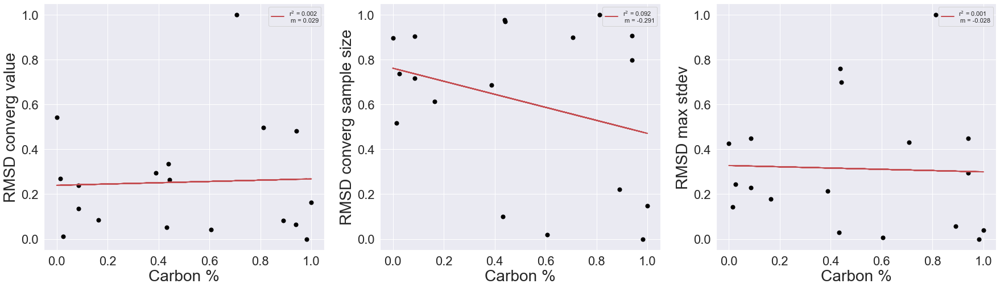

RMSD converg value:  0.4277854893602235 0.041501402027410796
RMSD converg sample size:  0.06358872608174013 0.8412401262329792
RMSD max stdev:  -0.021289509447025852 0.9326006535137623


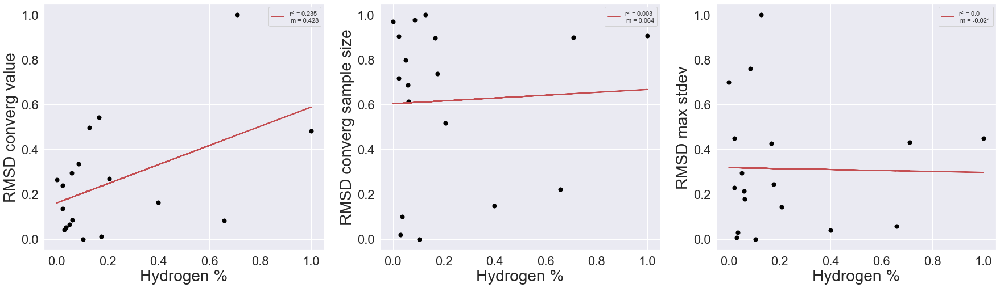

RMSD converg value:  -0.5301113299347207 0.08388642899498185
RMSD converg sample size:  0.08015042526299417 0.8408666192900199
RMSD max stdev:  -0.1777898600913942 0.546315678696653


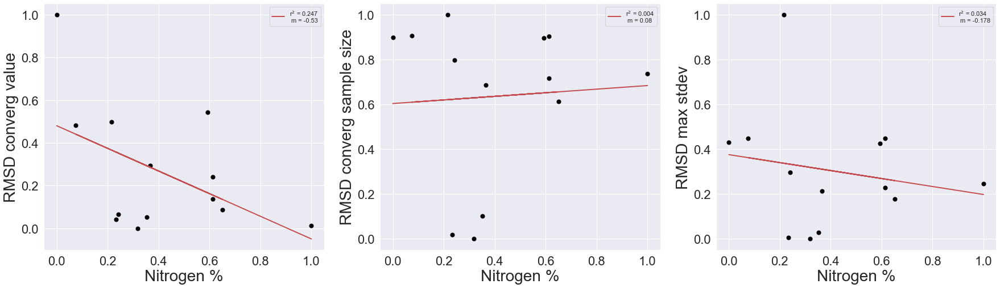

RMSD converg value:  0.09478166514756231 0.7095074582518914
RMSD converg sample size:  0.2917343568700262 0.4145598319629836
RMSD max stdev:  0.2046029614933517 0.4713391819237652


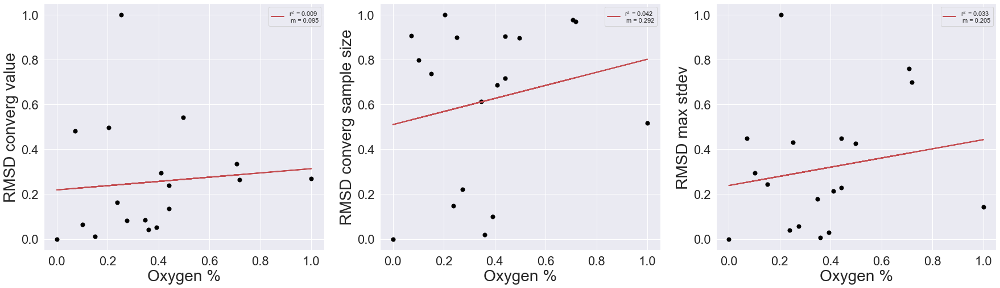

RMSD converg value:  0.7000120850929692 3.7132913703553264e-05
RMSD converg sample size:  0.7006024115960537 0.012381674401488676
RMSD max stdev:  0.6623021556854213 0.0016378318645387093


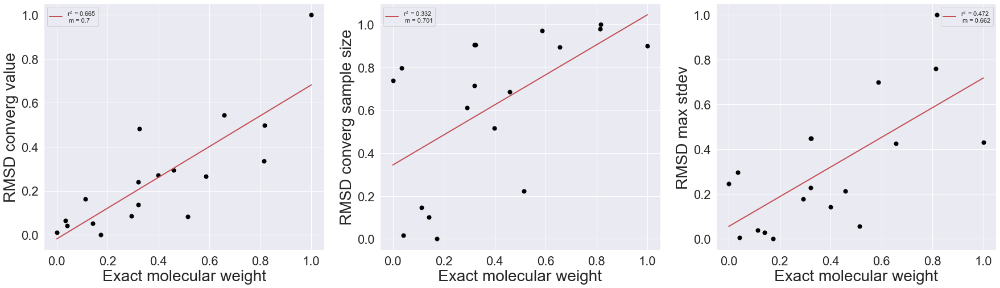

RMSD converg value:  0.8008673528395714 9.137549408622395e-06
RMSD converg sample size:  0.679939224249745 0.03156289045506851
RMSD max stdev:  0.6833612269864486 0.00395399458873475


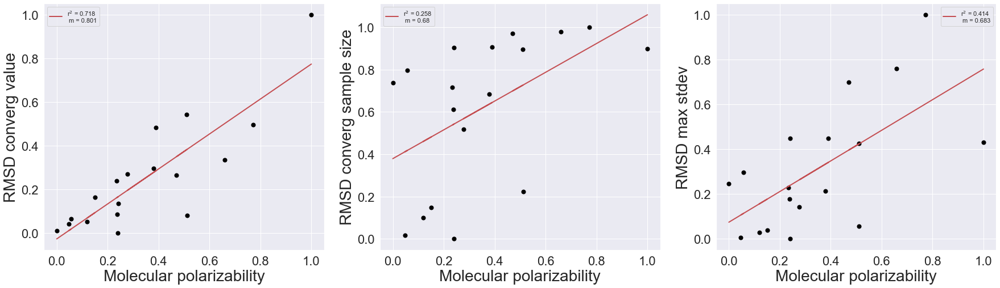

RMSD converg value:  0.8114695324029624 5.817557794027019e-06
RMSD converg sample size:  0.6953892454848153 0.027788692764315292
RMSD max stdev:  0.6692465942650666 0.005204560020349905


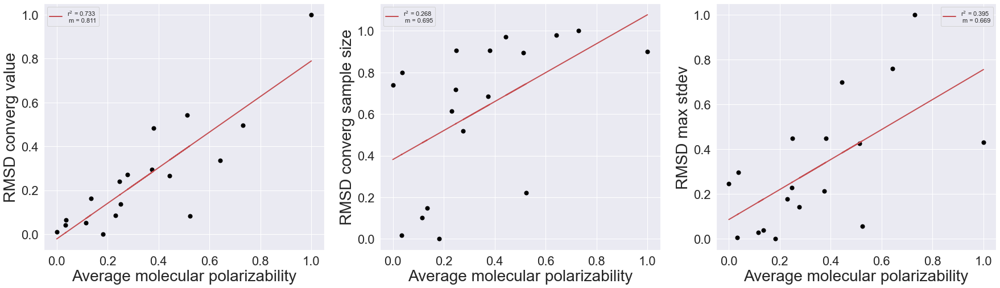

RMSD converg value:  0.5921222381486494 0.0004670899433463073
RMSD converg sample size:  0.49587336041876956 0.07030103008851117
RMSD max stdev:  0.5500087615286577 0.007117517568515763


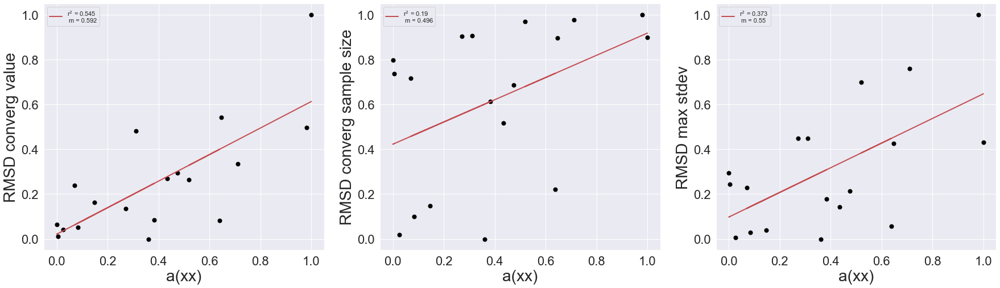

RMSD converg value:  0.6284885671405667 0.0004652597394871769
RMSD converg sample size:  0.4655740606543132 0.11363896727349629
RMSD max stdev:  0.5404251855396398 0.014488205102613476


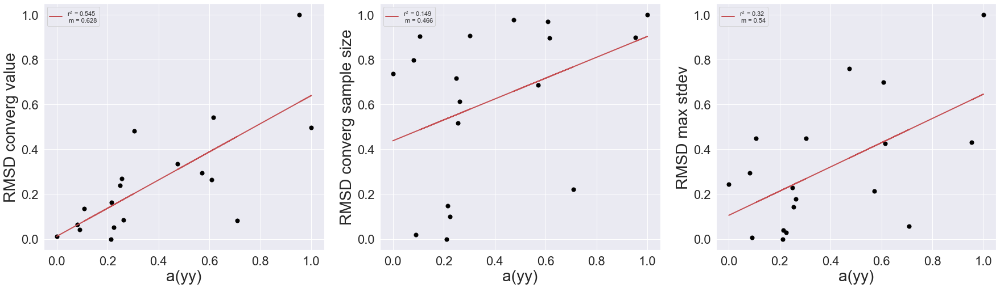

RMSD converg value:  0.8332892255565066 4.866955619420171e-06
RMSD converg sample size:  0.7881609377388304 0.012817979992461172
RMSD max stdev:  0.617087152323839 0.014209823394608193


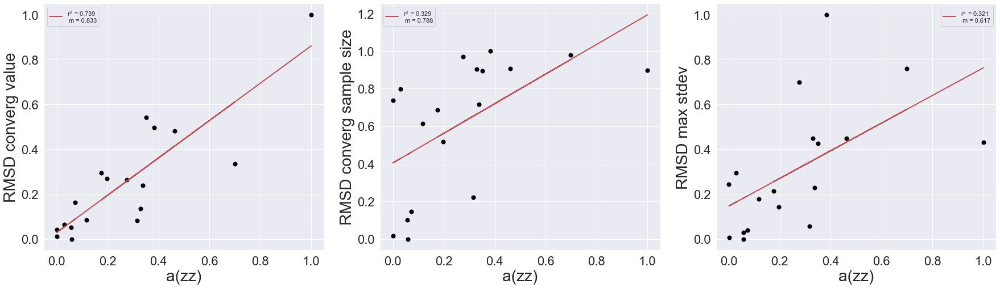

RMSD converg value:  0.9943840932202337 6.235193263797862e-07
RMSD converg sample size:  0.6545366904932924 0.08710762656277315
RMSD max stdev:  0.6104317147246475 0.039957739332016566


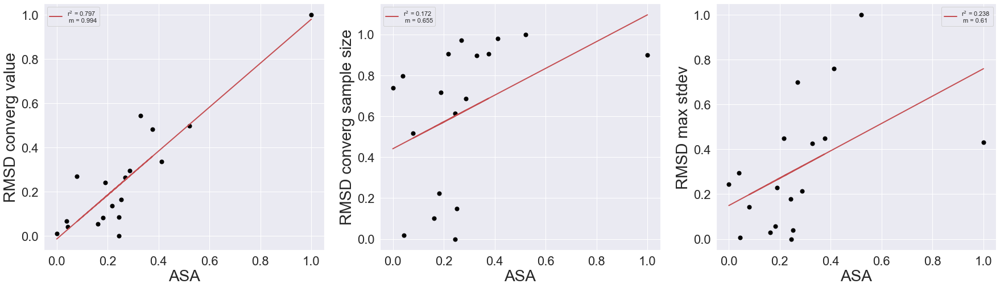

RMSD converg value:  0.9795925750428153 1.5660532951456454e-06
RMSD converg sample size:  0.5452413879138376 0.16060611094758206
RMSD max stdev:  0.5306897264969284 0.07954111602936646


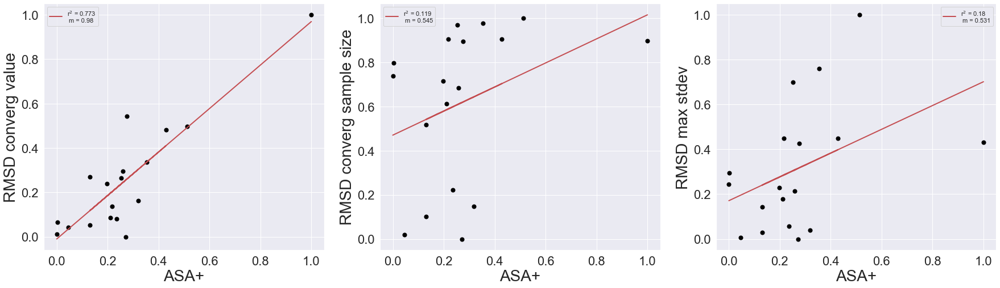

RMSD converg value:  0.7007565399500778 0.0007544331412899898
RMSD converg sample size:  0.774057625430935 0.015407662408836623
RMSD max stdev:  0.6522093887308158 0.00897025240487241


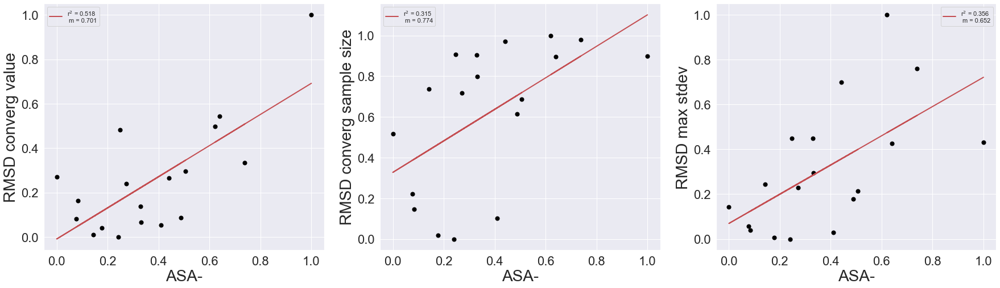

RMSD converg value:  0.8515105731527775 0.0001437340291455104
RMSD converg sample size:  0.4058899151081079 0.29424785734627906
RMSD max stdev:  0.4089144673868692 0.17745160012403288


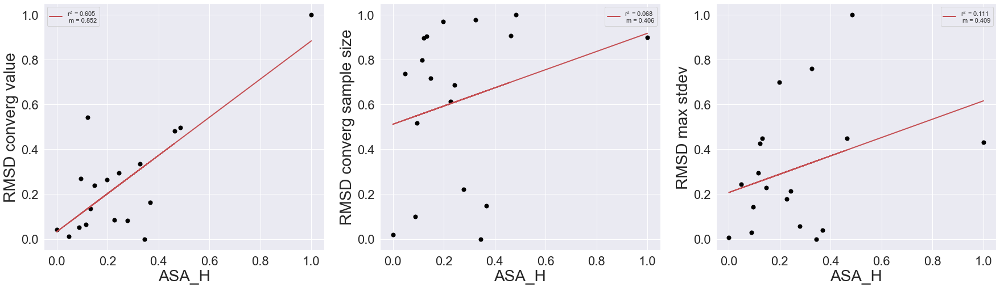

RMSD converg value:  0.08216508670986167 0.7325507443479036
RMSD converg sample size:  0.4226424983624845 0.20393833222157795
RMSD max stdev:  0.32175305649002073 0.22330613119531387


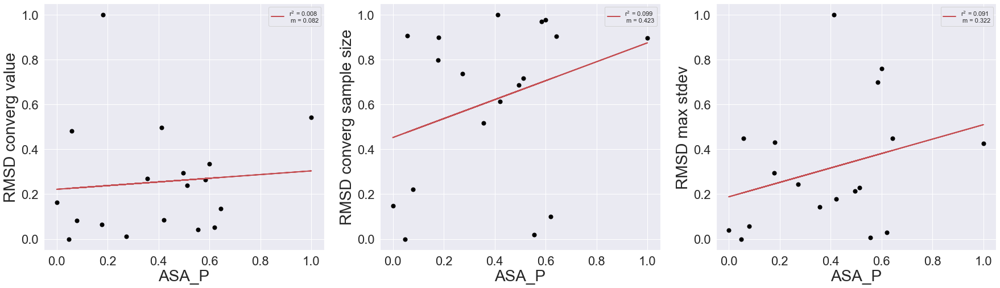

RMSD converg value:  0.03629683279397705 0.8465515114425344
RMSD converg sample size:  0.23317144862971 0.3746367103499013
RMSD max stdev:  0.15626034887713874 0.4544791446496995


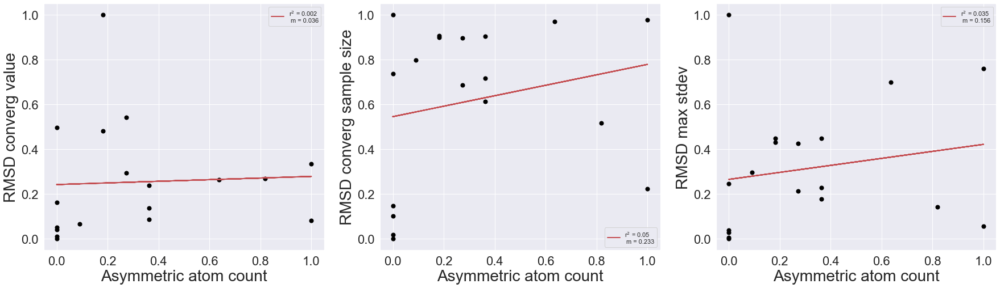

RMSD converg value:  0.5746156607509876 0.007791945615643683
RMSD converg sample size:  0.22712701340011887 0.5032174527635644
RMSD max stdev:  -0.02909198242991543 0.9144468556115043


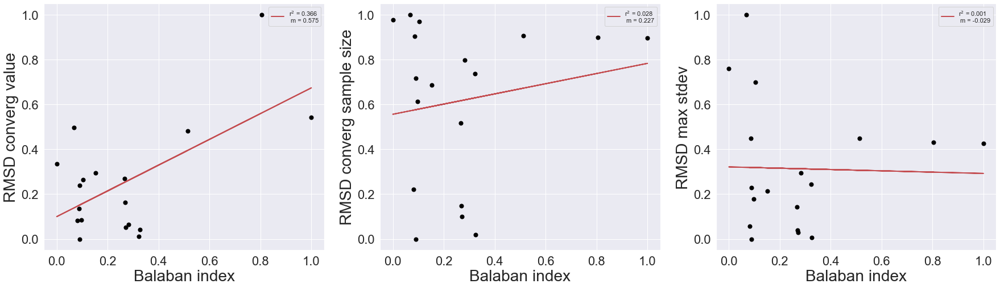

RMSD converg value:  -0.17017234663849504 0.3428312042725077
RMSD converg sample size:  -0.12429057888762776 0.6286588194422993
RMSD max stdev:  0.08599007938151933 0.673175914500595


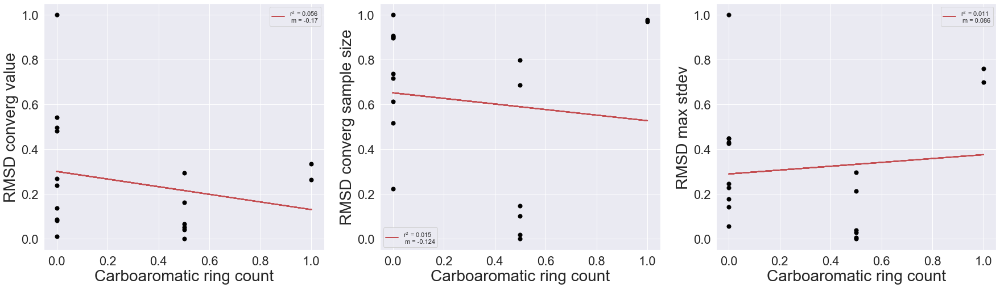

RMSD converg value:  -0.29418658827802796 0.2125959856097011
RMSD converg sample size:  -0.4403822294960801 0.18667665595304733
RMSD max stdev:  -0.1396305951495659 0.6059130499870251


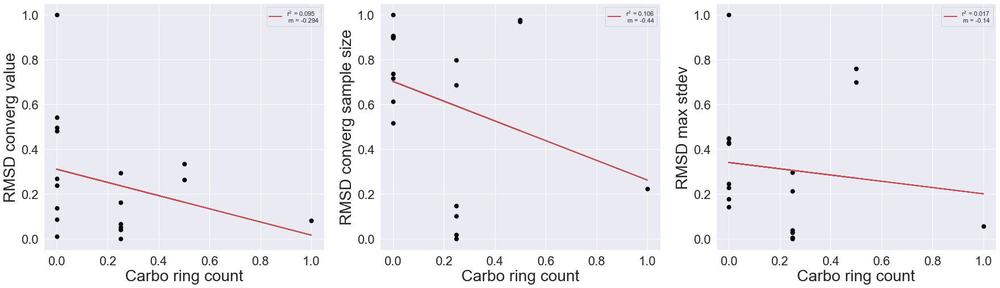

RMSD converg value:  0.03629683279397705 0.8465515114425344
RMSD converg sample size:  0.23317144862971 0.3746367103499013
RMSD max stdev:  0.15626034887713874 0.4544791446496995


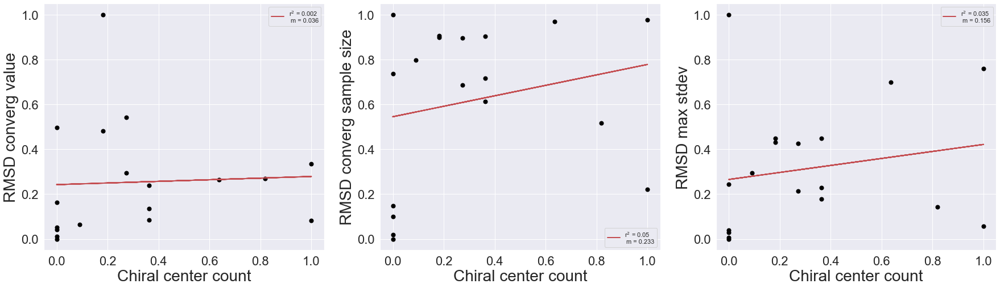

RMSD converg value:  -0.19948202128775663 0.3175888881787134
RMSD converg sample size:  0.13948053682312878 0.6262274444136646
RMSD max stdev:  0.3163297743329638 0.15130022906548998


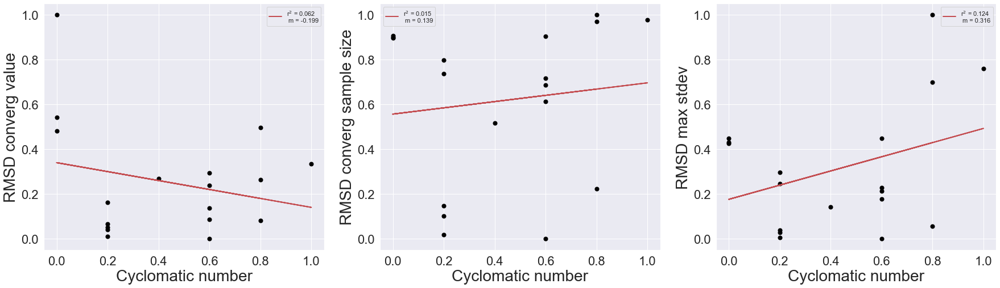

RMSD converg value:  0.09654795585411804 0.722169636011682
RMSD converg sample size:  0.40796822963315055 0.2810933869900127
RMSD max stdev:  0.42728196983310257 0.14828744356648357


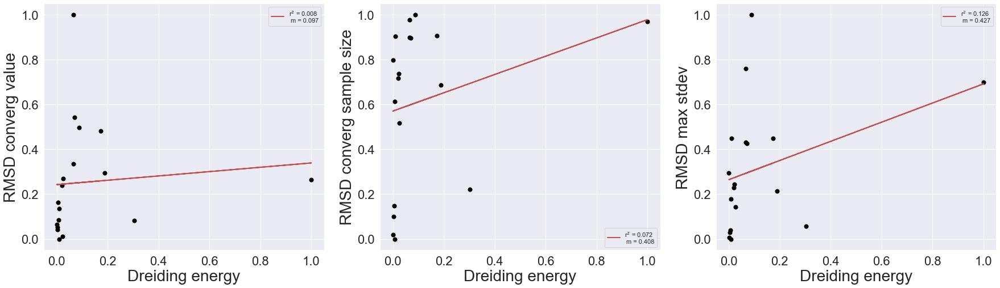

RMSD converg value:  -0.1682949019414808 0.3117931661180008
RMSD converg sample size:  -0.12042100918377886 0.6140067945832135
RMSD max stdev:  -0.1931214738090099 0.30110631879788524


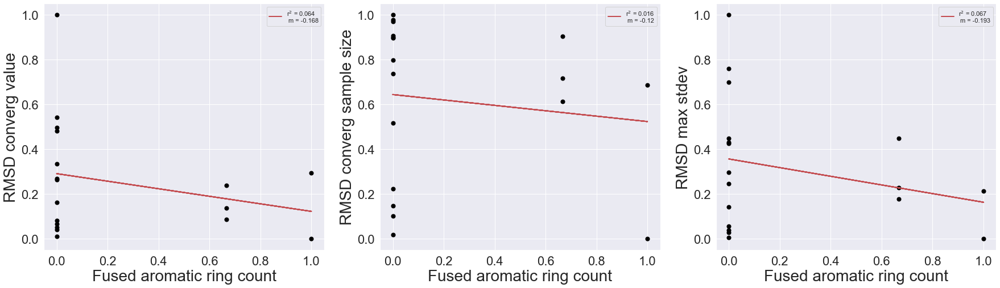

RMSD converg value:  -0.21847946941290072 0.233612022456882
RMSD converg sample size:  -0.13011279299588044 0.6233481074373036
RMSD max stdev:  -0.0985512631658745 0.6389279517224842


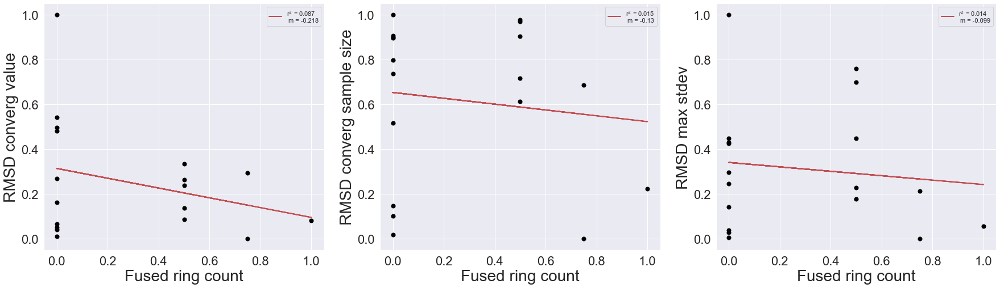

RMSD converg value:  0.5456134611947715 0.0012228091185095455
RMSD converg sample size:  0.6222389568083968 0.014955130611292493
RMSD max stdev:  0.6509822804536769 0.0004067500672210521


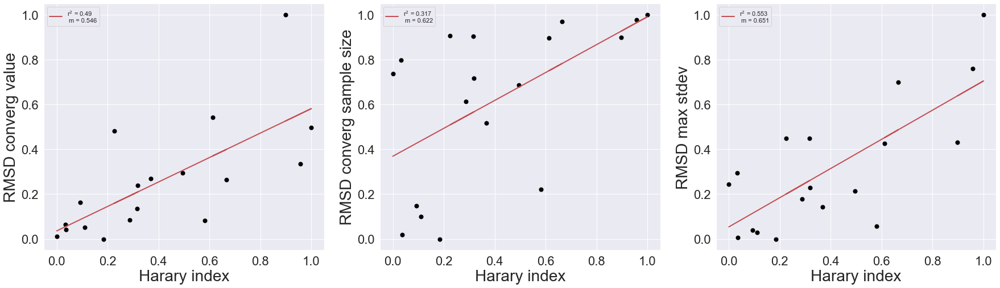

RMSD converg value:  0.9293153209679839 2.136732134557971e-06
RMSD converg sample size:  0.5874143327608832 0.10982647977046774
RMSD max stdev:  0.48652022592793065 0.09338271108147309


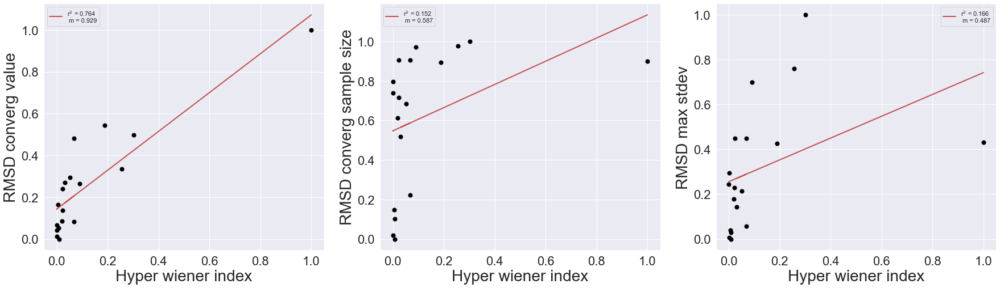

RMSD converg value:  0.9024051483722687 2.0210528340753176e-06
RMSD converg sample size:  0.7377386052653424 0.03268798246174255
RMSD max stdev:  0.6994456605031653 0.007978606204029199


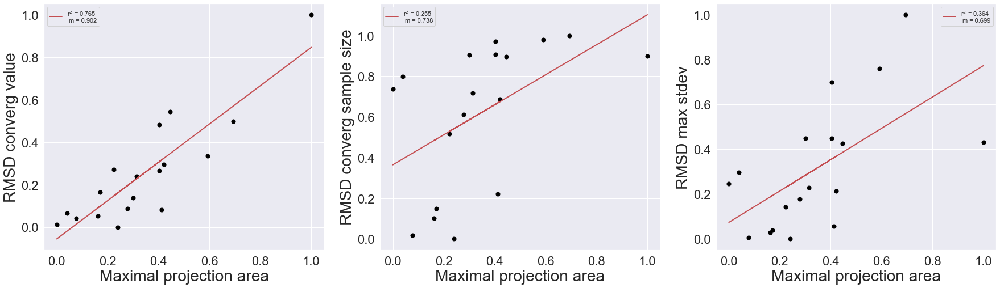

RMSD converg value:  0.9940701621914126 1.0601728785924463e-06
RMSD converg sample size:  0.725001930666013 0.05751900586402889
RMSD max stdev:  0.5858243450073234 0.05221562939551126


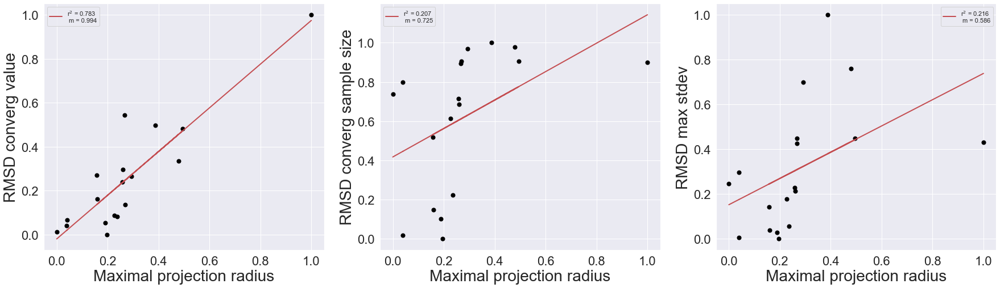

RMSD converg value:  0.7355854729362403 1.117278159816749e-05
RMSD converg sample size:  0.6653901953022985 0.021258327418319505
RMSD max stdev:  0.620424387730148 0.0048043309592686965


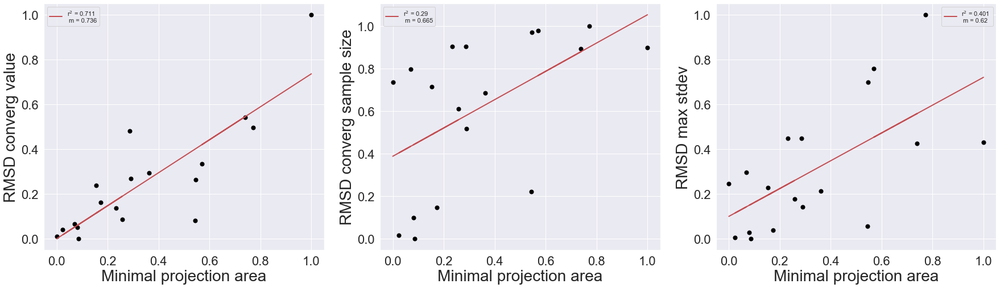

RMSD converg value:  0.7395160392945135 3.350524613065417e-05
RMSD converg sample size:  0.5377138566538411 0.08294175107166861
RMSD max stdev:  0.4851436169265572 0.044928012267756806


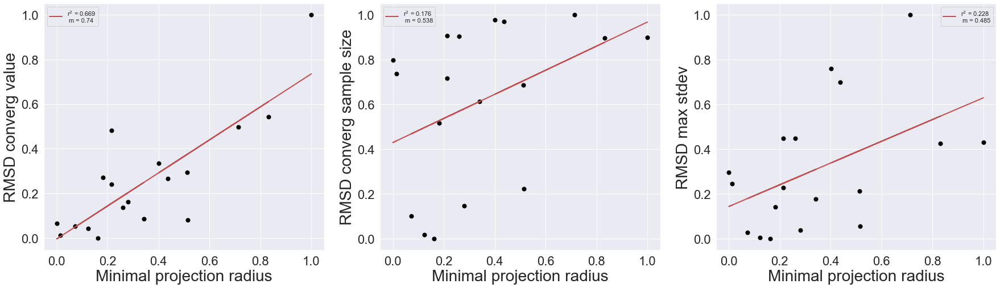

RMSD converg value:  0.9190667139356717 4.590489497852121e-07
RMSD converg sample size:  0.7176356100820056 0.037109661887114204
RMSD max stdev:  0.6416358740619681 0.016223664197871784


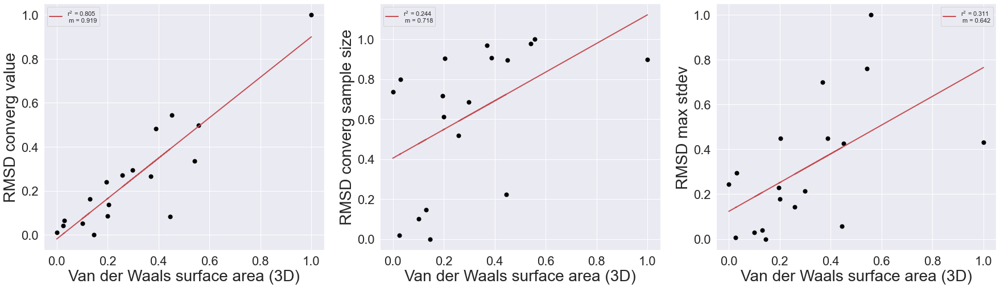

RMSD converg value:  0.7944168211699005 2.0787224369330518e-05
RMSD converg sample size:  0.6223531369723654 0.05568467901959095
RMSD max stdev:  0.560688774286717 0.026566993523431365


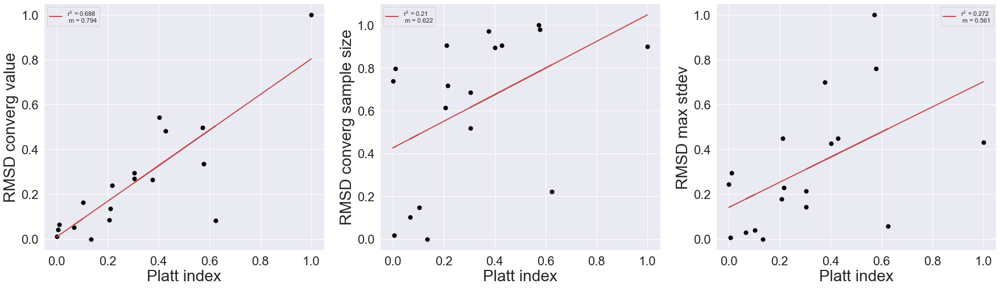

RMSD converg value:  0.47102363350585896 0.046886786670389334
RMSD converg sample size:  0.8000428827245137 0.013915519338692403
RMSD max stdev:  0.5927103405088341 0.02335720664897759


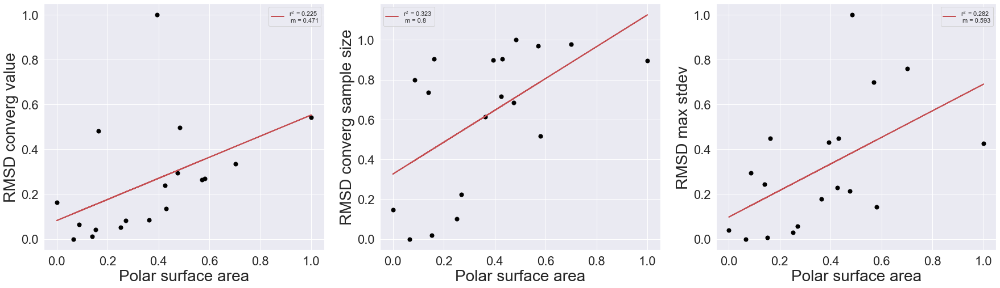

RMSD converg value:  0.8334312828888992 2.434470422136176e-06
RMSD converg sample size:  0.6953735090185306 0.029389762322879407
RMSD max stdev:  0.6358829297947874 0.009619648391542576


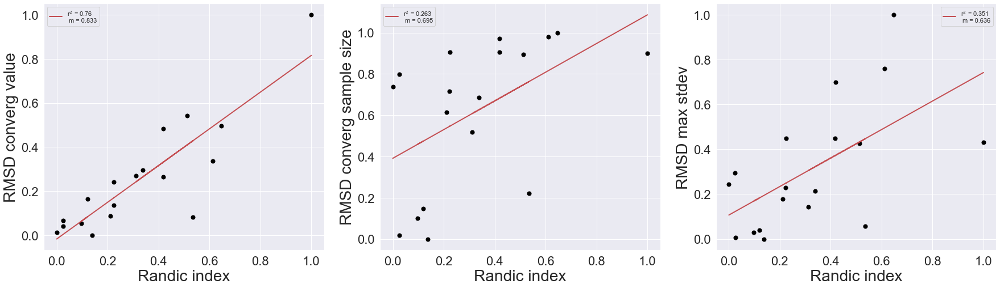

RMSD converg value:  0.7211268555243678 4.9300725891322086e-05
RMSD converg sample size:  0.649862892760785 0.029125113472576725
RMSD max stdev:  0.6502672399159927 0.0035754663394014868


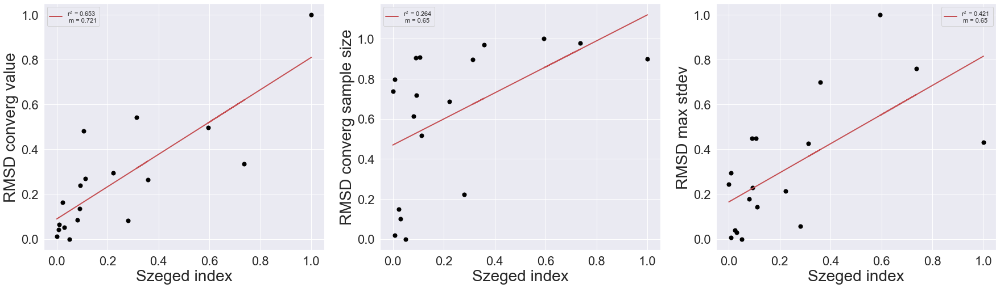

RMSD converg value:  0.8542537999868457 1.674293912391646e-06
RMSD converg sample size:  0.6843519341841834 0.036197374615461624
RMSD max stdev:  0.6178345438713156 0.01449228929630865


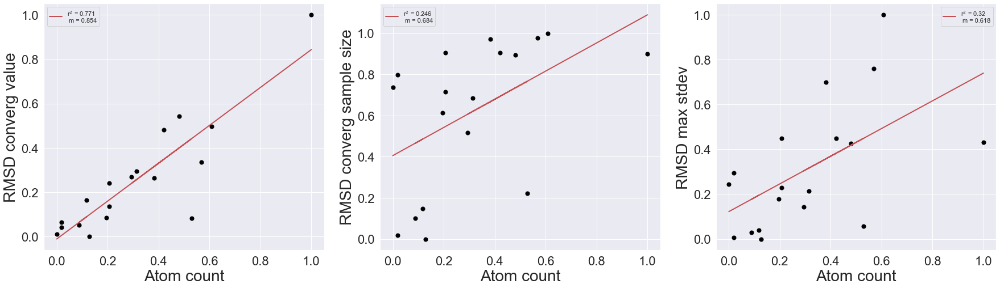

RMSD converg value:  0.7309562276510664 6.77414402316338e-06
RMSD converg sample size:  0.6550501371458399 0.02085908862150757
RMSD max stdev:  0.589017465808083 0.00693941861844438


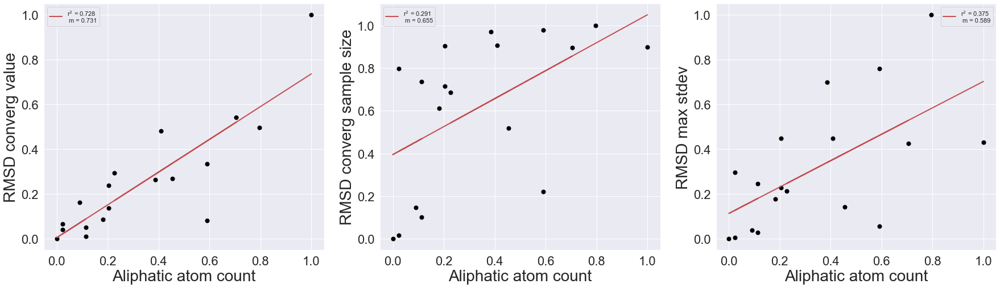

RMSD converg value:  -0.23586628395473455 0.17412954007736495
RMSD converg sample size:  -0.051316037264997005 0.8393975495434414
RMSD max stdev:  0.05975932630803412 0.765686665275285


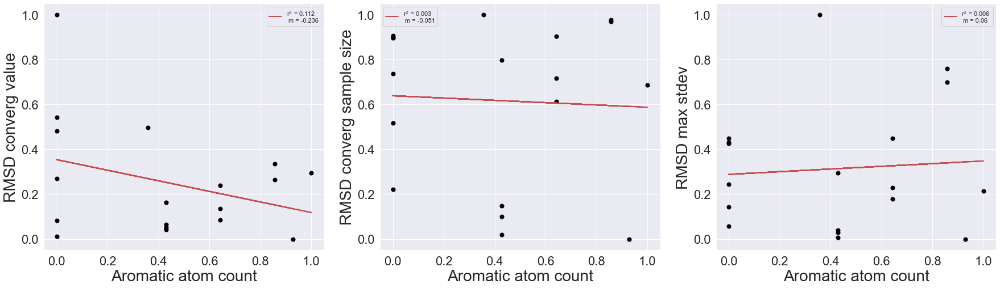

RMSD converg value:  0.8171954574423677 5.9811004522399455e-06
RMSD converg sample size:  0.6758477195614738 0.03491163150440374
RMSD max stdev:  0.6236339087222271 0.011402828489765059


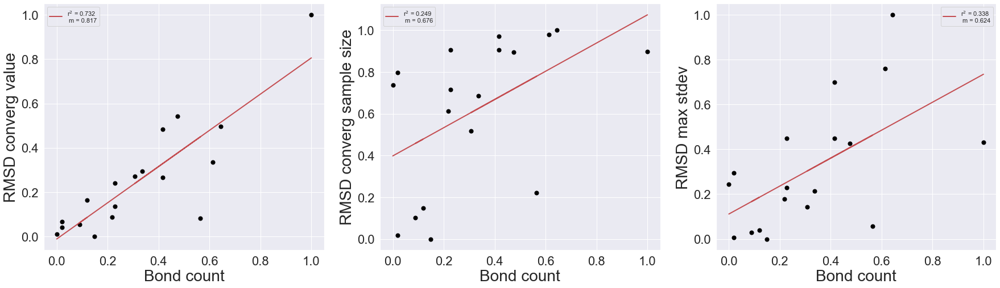

RMSD converg value:  0.6534398316964961 5.05782807817573e-05
RMSD converg sample size:  0.6245047495772419 0.01944784216799343
RMSD max stdev:  0.5881391667907653 0.003696191090237878


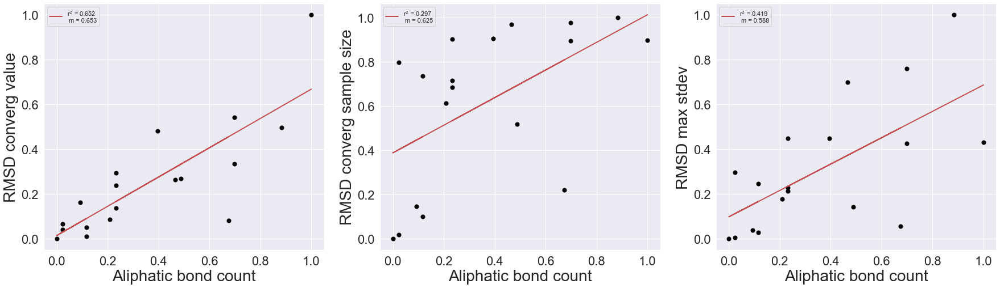

RMSD converg value:  -0.24650886660300458 0.1727627832289933
RMSD converg sample size:  -0.07095530976955362 0.7878776481360988
RMSD max stdev:  0.028388366211370118 0.8920486200683158


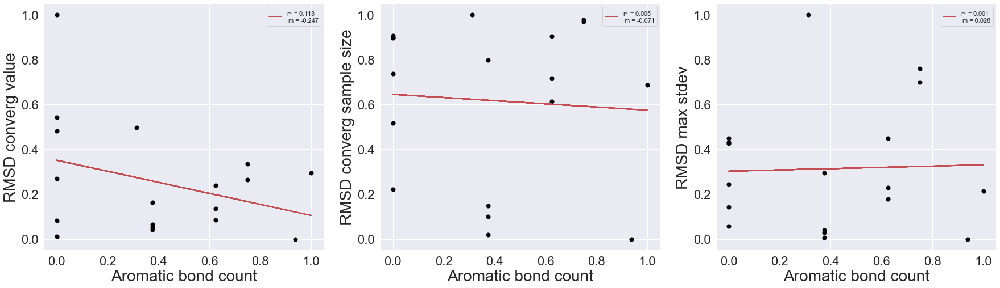

RMSD converg value:  0.9992820671746879 2.8794261102976205e-09
RMSD converg sample size:  0.5968280993820153 0.10111793030844196
RMSD max stdev:  0.3996068784058639 0.17154446514277982


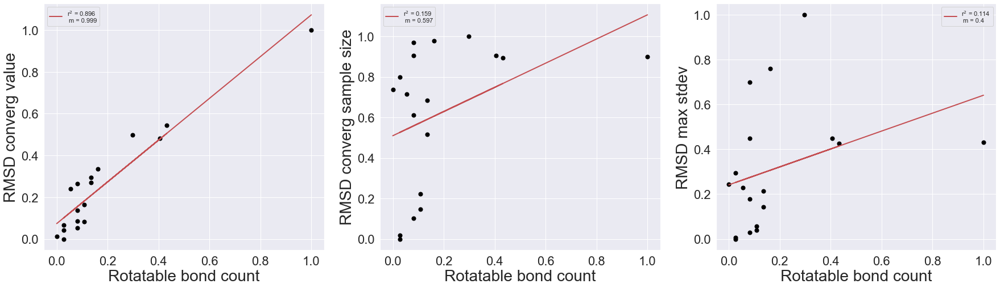

RMSD converg value:  -0.19948202128775663 0.3175888881787134
RMSD converg sample size:  0.13948053682312878 0.6262274444136646
RMSD max stdev:  0.3163297743329638 0.15130022906548998


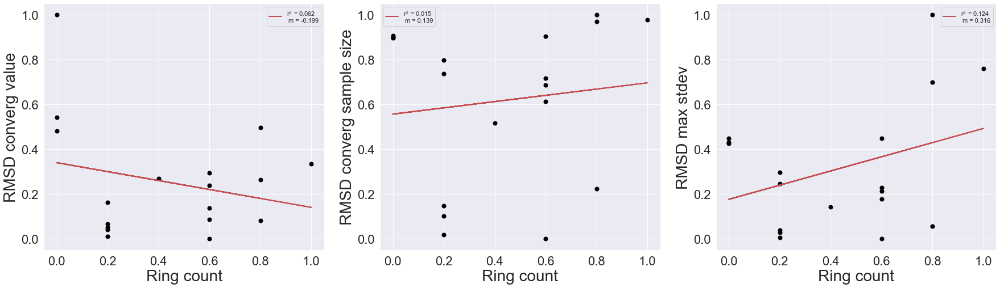

RMSD converg value:  -0.028366864990464053 0.8871280479982404
RMSD converg sample size:  0.23739257337441216 0.3966672210339318
RMSD max stdev:  0.3772945278429498 0.07745023055852339


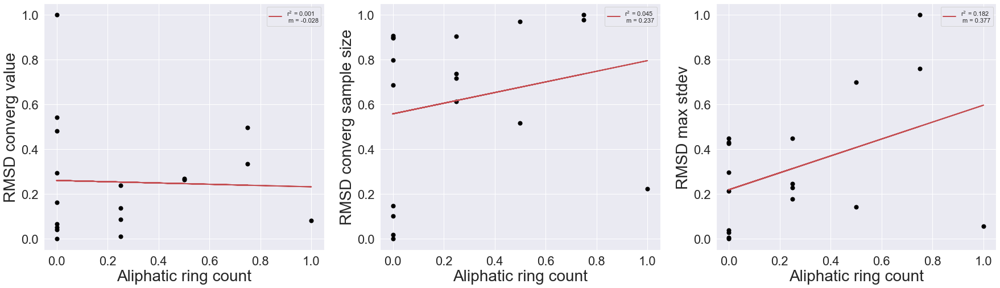

RMSD converg value:  -0.2427614798939486 0.17528296269820368
RMSD converg sample size:  -0.07721569469583095 0.767408966177852
RMSD max stdev:  0.007741846529115048 0.970194065107868


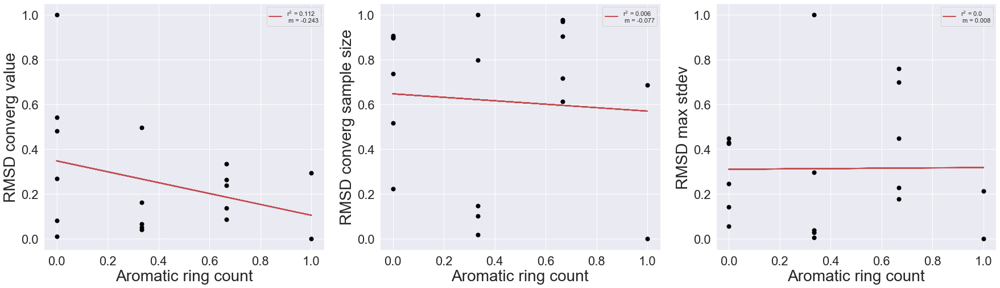

RMSD converg value:  -0.033845722302213034 0.8513274423068706
RMSD converg sample size:  0.38387937679482403 0.11914790875023111
RMSD max stdev:  0.39161547264704144 0.03900580489615007


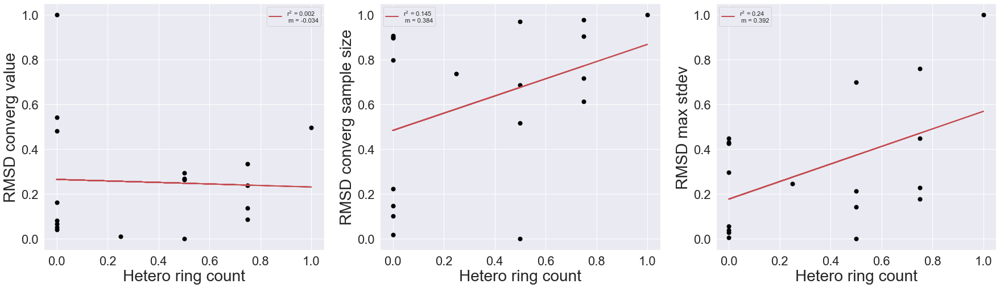

RMSD converg value:  0.07668072609232253 0.6717545970565286
RMSD converg sample size:  0.5087638254626087 0.033665020949759
RMSD max stdev:  0.576301637128516 0.0007947018726240545


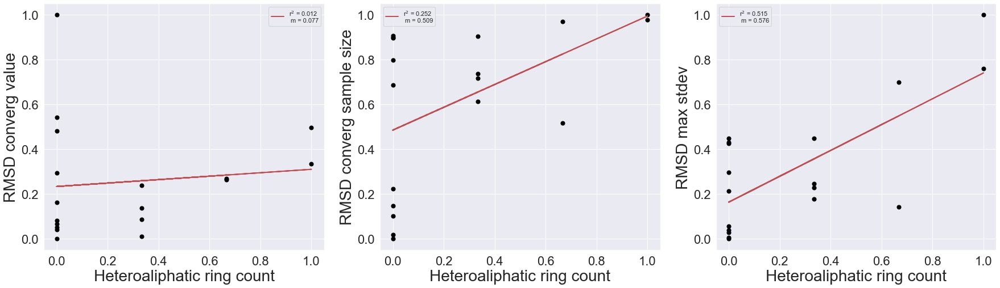

RMSD converg value:  -0.10905389823893127 0.43134514337374985
RMSD converg sample size:  0.006810442678774109 0.9726157398457445
RMSD max stdev:  -0.044170436328900387 0.7784983711788023


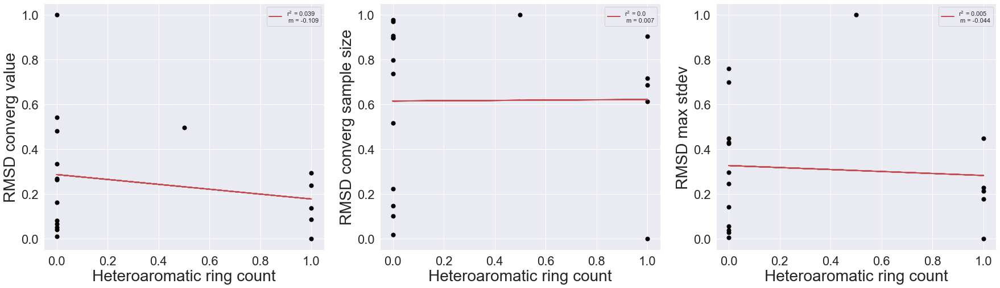

RMSD converg value:  -0.19983602206973206 0.37217806353975946
RMSD converg sample size:  0.2149663122598382 0.5005740383989482
RMSD max stdev:  0.4225535208925278 0.08177577430189825


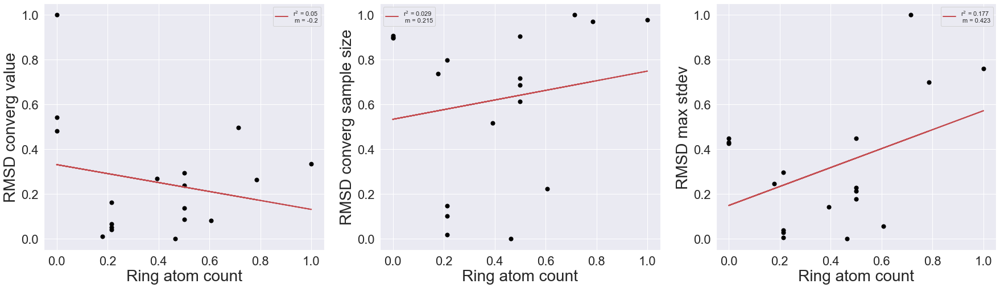

RMSD converg value:  -0.20934098630911332 0.3346470116528403
RMSD converg sample size:  0.16733985390501996 0.5901915460446614
RMSD max stdev:  0.3642213931433805 0.12647297901727117


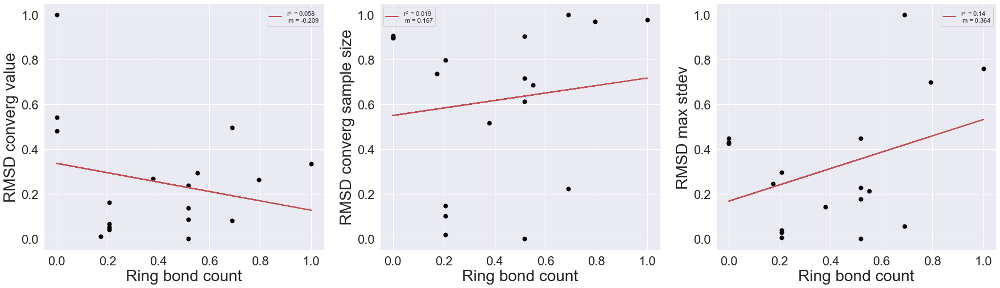

RMSD converg value:  0.910162047261126 6.325077180268619e-10
RMSD converg sample size:  0.6238592900593805 0.05342739493542832
RMSD max stdev:  0.45683009687454557 0.07709384646018755


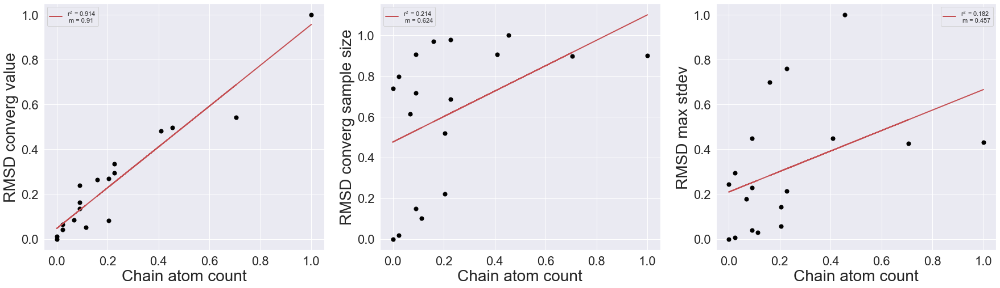

RMSD converg value:  0.9162585929988173 1.1235443986661684e-10
RMSD converg sample size:  0.6812171463811065 0.03216606958830551
RMSD max stdev:  0.533819441285068 0.034482452675062676


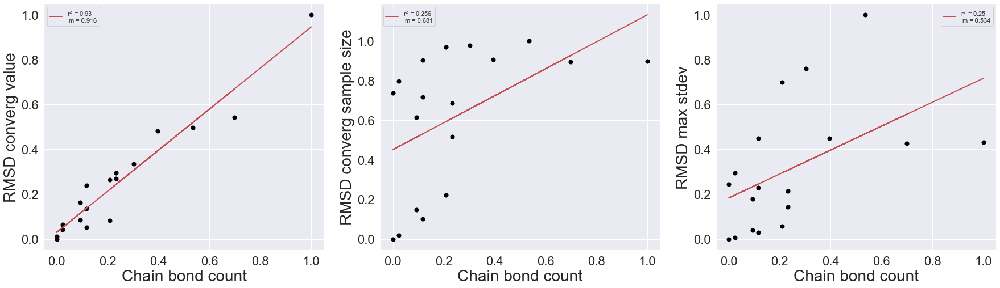

RMSD converg value:  0.008727916782190868 0.911021390797835
RMSD converg sample size:  -0.06050348629803792 0.7632280485711276
RMSD max stdev:  0.0042402204839173925 0.9798372922313925


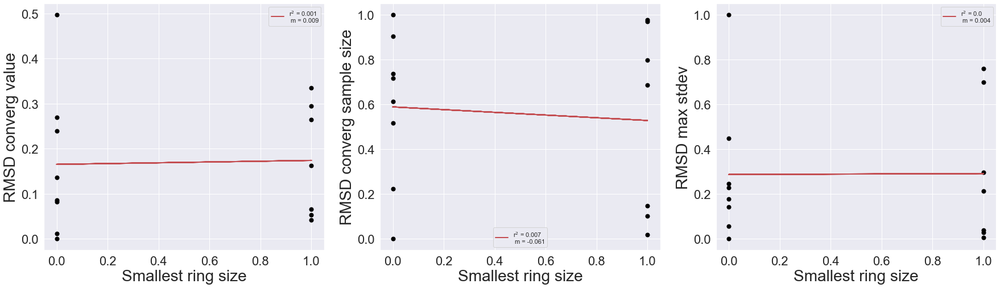

RMSD converg value:  -0.09775299336671353 0.3867695350659298
RMSD converg sample size:  -0.355583689862918 0.21435668223627696
RMSD max stdev:  -0.3844685909165566 0.09949006700866671


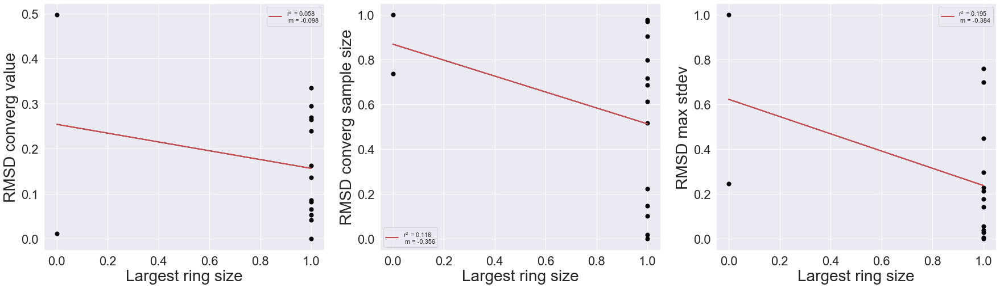

RMSD converg value:  0.884335348842313 7.362904943686333e-07
RMSD converg sample size:  0.6851237693079862 0.04051834758144555
RMSD max stdev:  0.637636820298712 0.013208360927890796


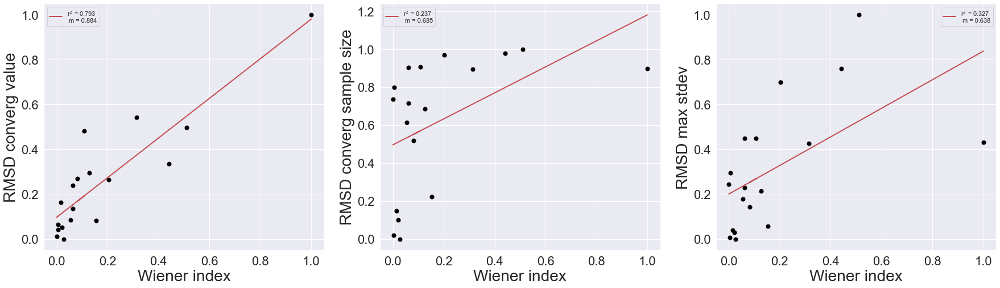

RMSD converg value:  0.39452847589379897 0.047955996159030845
RMSD converg sample size:  0.5605889489252609 0.04731596186286751
RMSD max stdev:  0.6159965975985523 0.003107530710037645


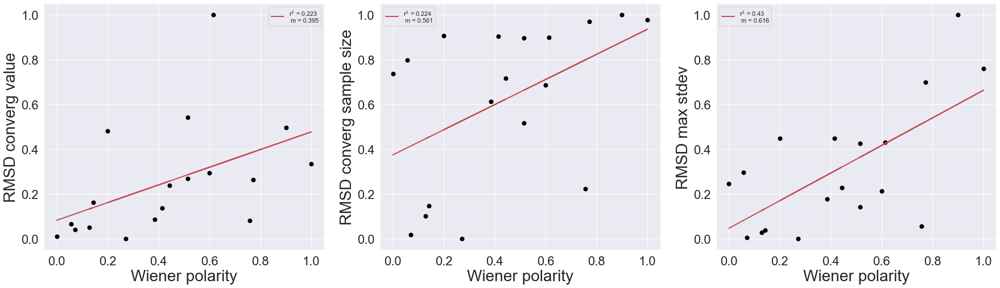

RMSD converg value:  -0.0182134760378271 0.9254710831496409
RMSD converg sample size:  0.0059286433305846655 0.9828619765992553
RMSD max stdev:  0.09213533141565992 0.6727081939038777


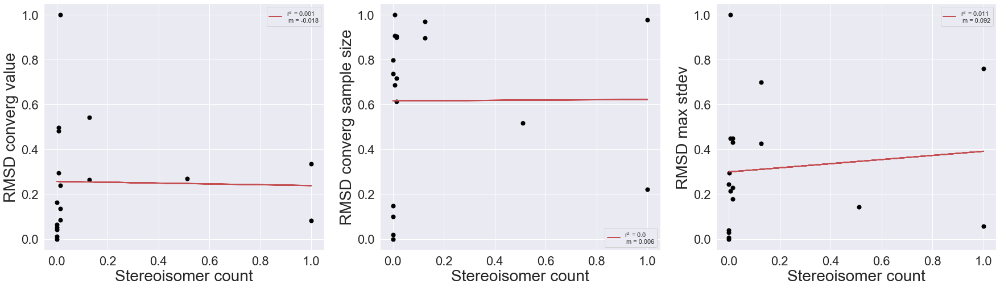

RMSD converg value:  0.2873744259067773 0.28520131111172997
RMSD converg sample size:  0.38521439719474615 0.31309945979501264
RMSD max stdev:  0.16142172039716393 0.5981593605329616


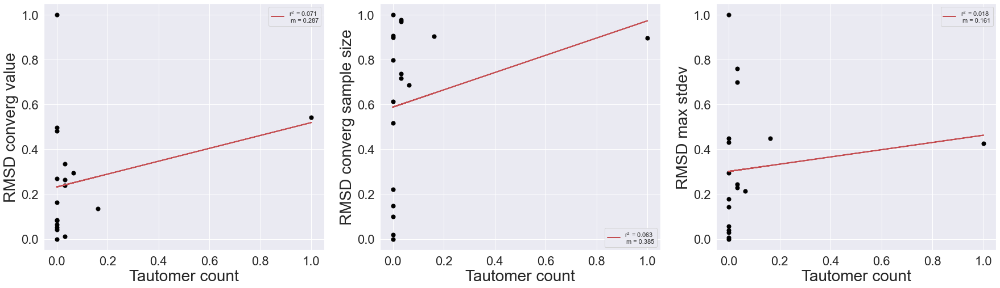

RMSD converg value:  -0.0427013619853255 0.8250139202986697
RMSD converg sample size:  -0.015870562162015288 0.9537991560933767
RMSD max stdev:  0.07989067492453059 0.7122888336271774


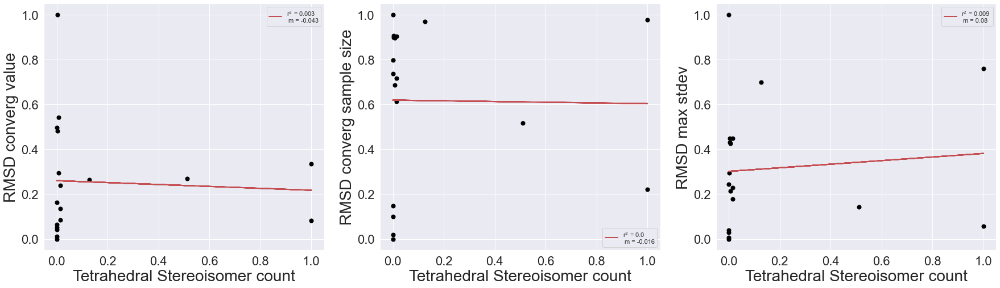

RMSD converg value:  0.4392764825673068 0.12476442755389018
RMSD converg sample size:  -0.14243973254909617 0.7347313509922921
RMSD max stdev:  0.03316163941984227 0.9208469144521182


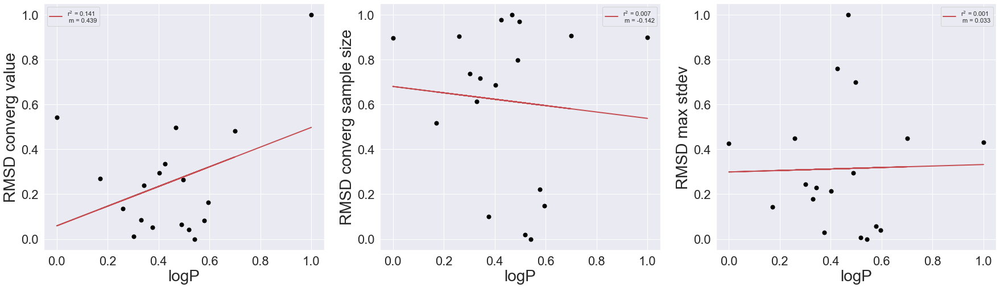

RMSD converg value:  -0.05434100687066789 0.8598029188057346
RMSD converg sample size:  0.41298459912328017 0.2728544765528475
RMSD max stdev:  0.03516261140917082 0.9026509965489518


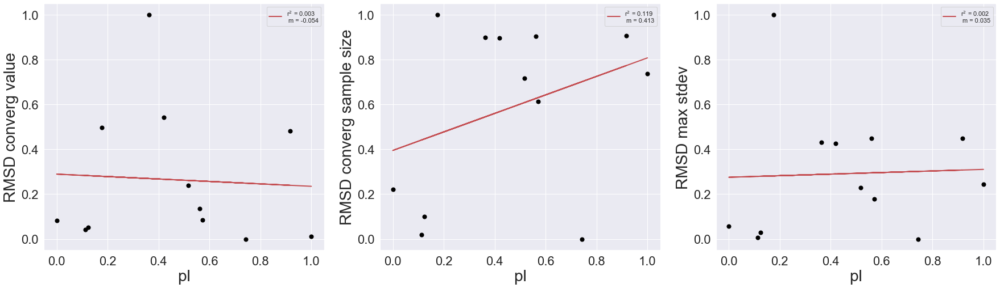

RMSD converg value:  0.2763350997957558 0.19427640088290654
RMSD converg sample size:  0.6560471482157909 0.021451880919145256
RMSD max stdev:  0.4525369608559561 0.050307693617869895


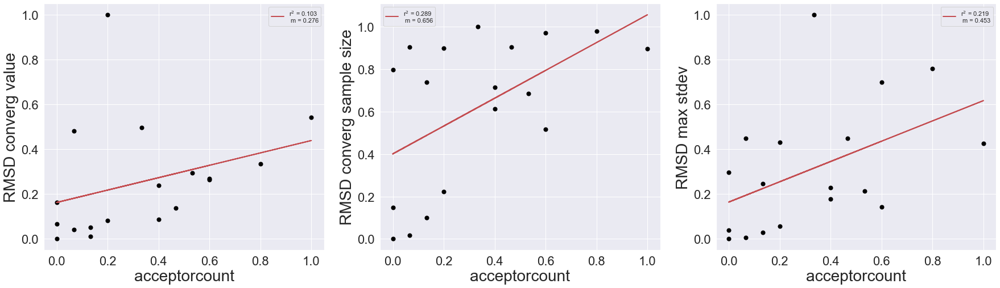

RMSD converg value:  0.28698806125156623 0.2304140394600252
RMSD converg sample size:  0.6782745091029343 0.036211814948115977
RMSD max stdev:  0.502832121104627 0.052321119262373435


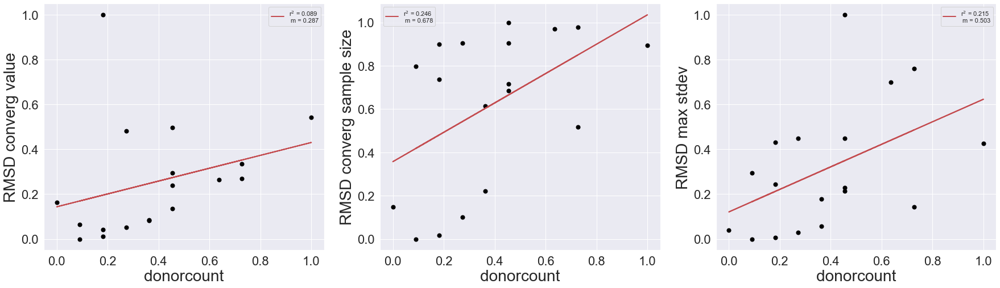

RMSD converg value:  0.2576929521377147 0.18676112509683235
RMSD converg sample size:  0.5779800452762441 0.028412295075387076
RMSD max stdev:  0.45615468292488776 0.02919682651706706


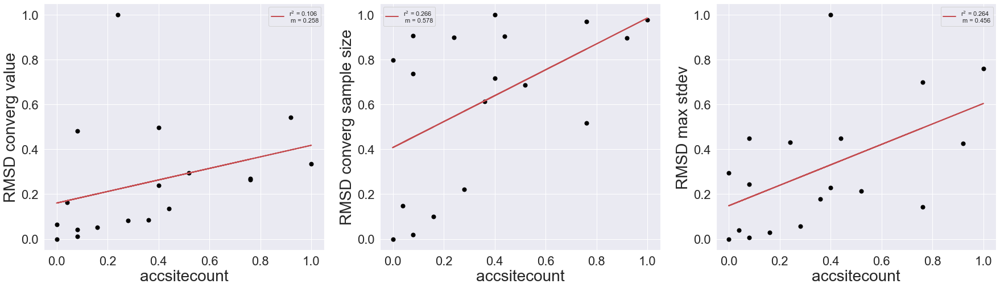

RMSD converg value:  0.390739522091592 0.13575358108289082
RMSD converg sample size:  0.7059254938828642 0.05129191748864422
RMSD max stdev:  0.5134511707117018 0.07668179693507222


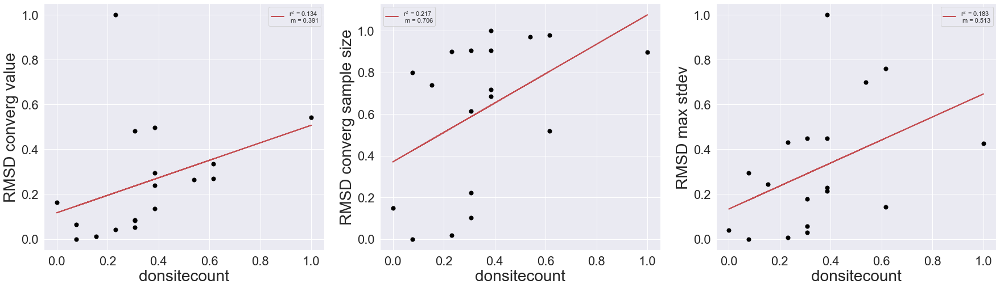

RMSD converg value:  0.7559579627331953 6.339727091139655e-06
RMSD converg sample size:  0.7028912341900334 0.01552651810067022
RMSD max stdev:  0.6805127116750372 0.0017159571339147456


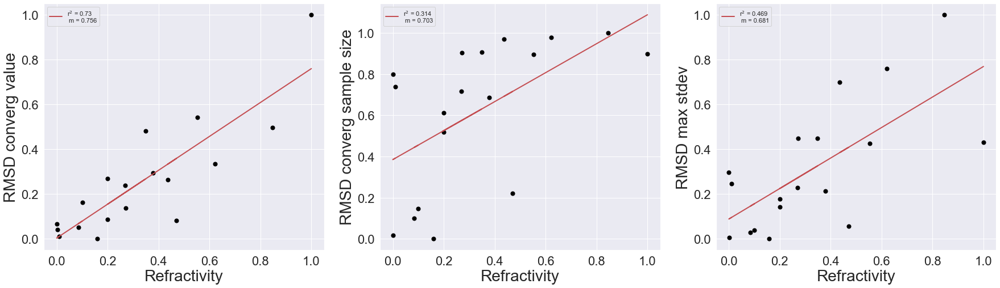

RMSD converg value:  0.05232100308573288 0.707387524007083
RMSD converg sample size:  0.26524734835534924 0.1672151899788112
RMSD max stdev:  0.26175087092325366 0.07985258406072927


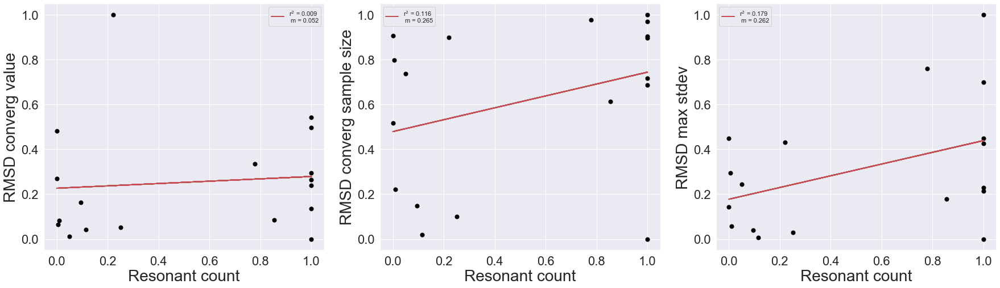

RMSD converg value:  -0.10451564006127126 0.6359312063973224
RMSD converg sample size:  -0.18129989401522234 0.5403241654618887
RMSD max stdev:  -0.13148163531973625 0.5858115121027447


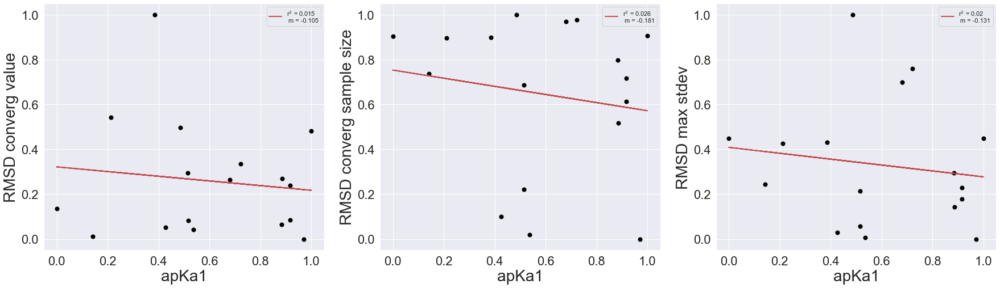

RMSD converg value:  -0.4674987628557383 0.0004205172204936912
RMSD converg sample size:  -0.6825652216301467 0.0101863450408446
RMSD max stdev:  -0.7026969528161594 0.0017644267647107534


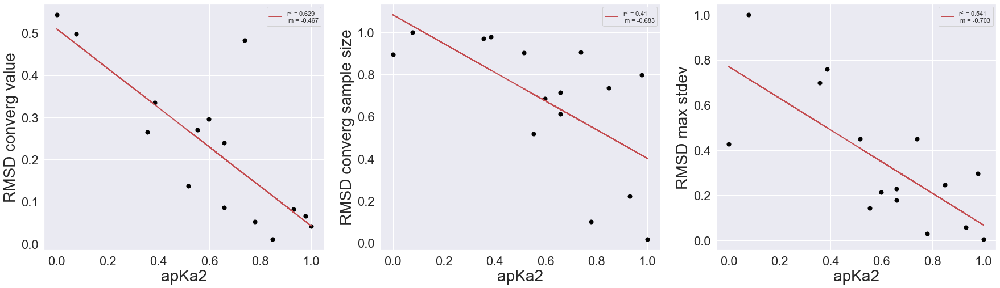

RMSD converg value:  0.17384070763310464 0.3588455749557373
RMSD converg sample size:  0.2610535478513062 0.33013341500763094
RMSD max stdev:  0.10414177774035753 0.6279642751904511


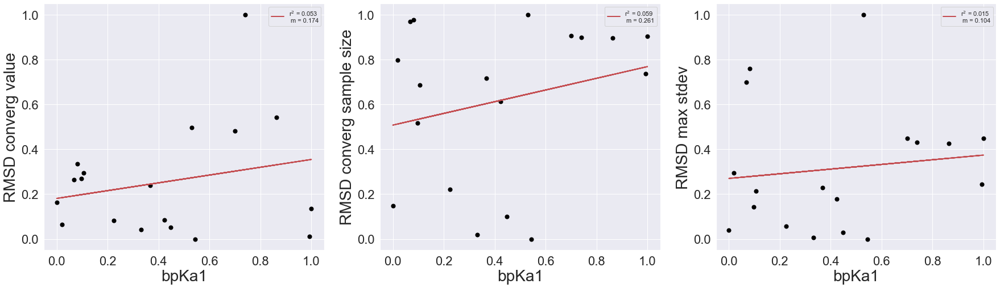

RMSD converg value:  0.7219742608856677 2.5080243946451293e-05
RMSD converg sample size:  0.7208523950491581 0.011414562731252959
RMSD max stdev:  0.6978932114887179 0.0009627888603878723


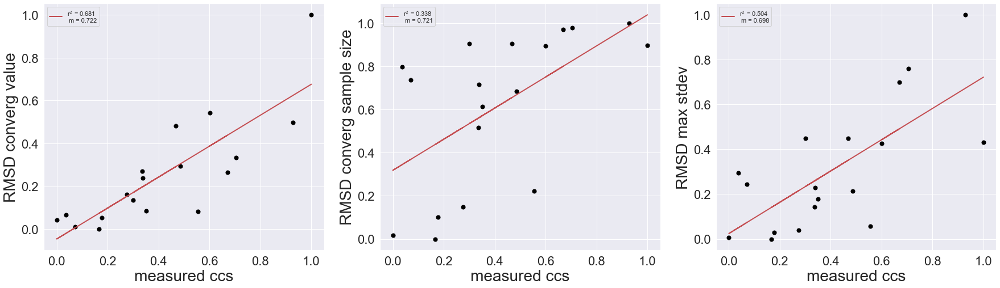

In [10]:
# Normalizes ranges from 0 to 1. This allows slopes to be more meanignnful and be compared across properties. 
# Also replaces 'Largest ring size' and 'Smallest ring size' 0's with np.nan

sns.set(style="darkgrid")
pears = []
slopes = []

for xcol in CXCALCdf.columns:
    
    # First replace 0's from ring sizes with nan's
    CXCALCdf['Largest ring size'].replace(0, np.nan, inplace=True)
    CXCALCdf['Smallest ring size'].replace(0, np.nan, inplace=True)
    
    try:
        x = CXCALCdf[xcol].astype(float)
        
        # Normalize
        x -= x.min()
        x /= x.max()
        
    except:
        continue
    
    ps = []
    plt.figure(figsize=(30,8))
    
    ####------
    ax1 = plt.subplot(1,3,1)
    ycol = 'RMSD converg value'
    y = MCdf[ycol].astype(float)
    y -= y.min()
    y /= y.max()
    plt.scatter(x, y , s=50, c='black')
    plt.title('', fontsize=27)
    plt.xlabel(xcol, fontsize=28)
    plt.ylabel(ycol, fontsize=28)

    plt.tick_params(axis='both', which='major', labelsize=22)
    ax1.yaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
    
    # Plot the Linear regression line
    x_x = x.values
    y_y = y.values
    mask = ~np.isnan(x_x) & ~np.isnan(y_y)    
    lr = linregress(x_x[mask], y_y[mask])
    m = lr[0]
    r2 = lr[2]**2
    pval = lr[3]

    # Linear regression
    x_vals = x_x[mask].reshape(-1, 1)
    y_vals = y_y[mask].reshape(-1, 1)
    linear_regressor = LinearRegression()  # create object for the class
    linear_regressor.fit(x_vals, y_vals)  # perform linear regression
    y_pred = linear_regressor.predict(x_vals)     
    
    plt.plot(x_vals, y_pred, color='r', linestyle='-', linewidth=2,
             label=f'r$^2$ = {np.round(r2, decimals=3)} \n m = {np.round(m, decimals=3)}')
    plt.legend() 
    
 
    ## Pearson r
    print(f'{ycol}: ', m, pval)
    ps.append(pval)
    ps.append(m)
    
    
    
    ####------
    ax2 = plt.subplot(1,3,2)
    ycol = 'RMSD converg sample size'
    y = MCdf[ycol].astype(float)
    y -= y.min()
    y /= y.max()
    plt.scatter(x, y , s=50, c='black')
    plt.title('', fontsize=27)
    plt.xlabel(xcol, fontsize=28)
    plt.ylabel(ycol, fontsize=28)

    plt.tick_params(axis='both', which='major', labelsize=22)
    ax2.yaxis.set_major_formatter(FormatStrFormatter('%0.1f'))
    
    # Plot the Linear regression line
    x_x = x.values
    y_y = y.values
    mask = ~np.isnan(x_x) & ~np.isnan(y_y)    
    lr = linregress(x_x[mask], y_y[mask])
    m = lr[0]
    r2 = lr[2]**2
    pval = lr[3]

    # Linear regression
    x_vals = x_x[mask].reshape(-1, 1)
    y_vals = y_y[mask].reshape(-1, 1)
    linear_regressor = LinearRegression()  # create object for the class
    linear_regressor.fit(x_vals, y_vals)  # perform linear regression
    y_pred = linear_regressor.predict(x_vals)     
    
    plt.plot(x_vals, y_pred, color='r', linestyle='-', linewidth=2,
             label=f'r$^2$ = {np.round(r2, decimals=3)} \n m = {np.round(m, decimals=3)}')    
    plt.legend() 
    
    ## Pearson r
    print(f'{ycol}: ', m, pval)
    ps.append(pval)
    ps.append(m)
    
    
    ####------
    ax3 = plt.subplot(1,3,3)
    ycol = 'RMSD max stdev'
    y = MCdf[ycol].astype(float)
    y -= y.min()
    y /= y.max()
    plt.scatter(x, y, s=50, c='black')
    plt.title('', fontsize=27)
    plt.xlabel(xcol, fontsize=28)
    plt.ylabel(ycol, fontsize=28)

    plt.tick_params(axis='both', which='major', labelsize=22)
    ax3.yaxis.set_major_formatter(FormatStrFormatter('%0.1f')) #'%0.1f'))
    
    # Plot the Linear regression line
    x_x = x.values
    y_y = y.values
    mask = ~np.isnan(x_x) & ~np.isnan(y_y)    
    lr = linregress(x_x[mask], y_y[mask])
    m = lr[0]
    r2 = lr[2]**2
    pval = lr[3]

    # Linear regression
    x_vals = x_x[mask].reshape(-1, 1)
    y_vals = y_y[mask].reshape(-1, 1)
    linear_regressor = LinearRegression()  # create object for the class
    linear_regressor.fit(x_vals, y_vals)  # perform linear regression
    y_pred = linear_regressor.predict(x_vals)     
    
    plt.plot(x_vals, y_pred, color='r', linestyle='-', linewidth=2,
             label=f'r$^2$ = {np.round(r2, decimals=3)} \n m = {np.round(m, decimals=3)}')
    plt.legend()
 
    ## Pearson r
    print(f'{ycol}: ', m, pval)
    ps.append(pval)
    ps.append(m)
    pears.append(ps)
    
    plt.show()

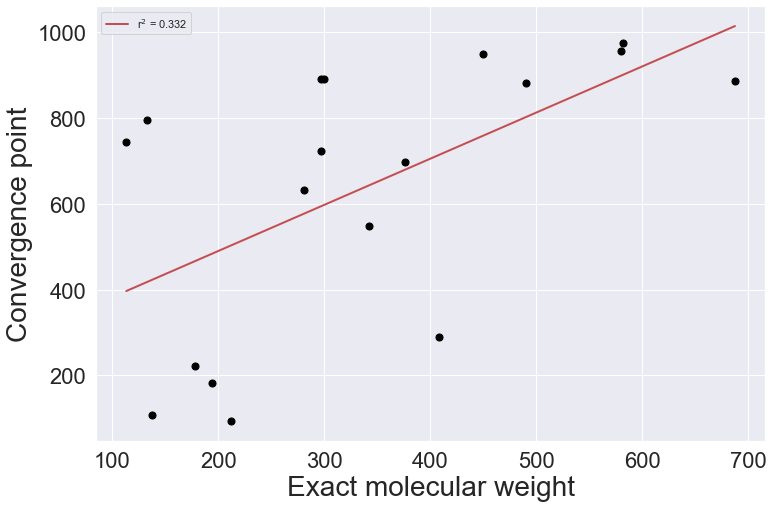

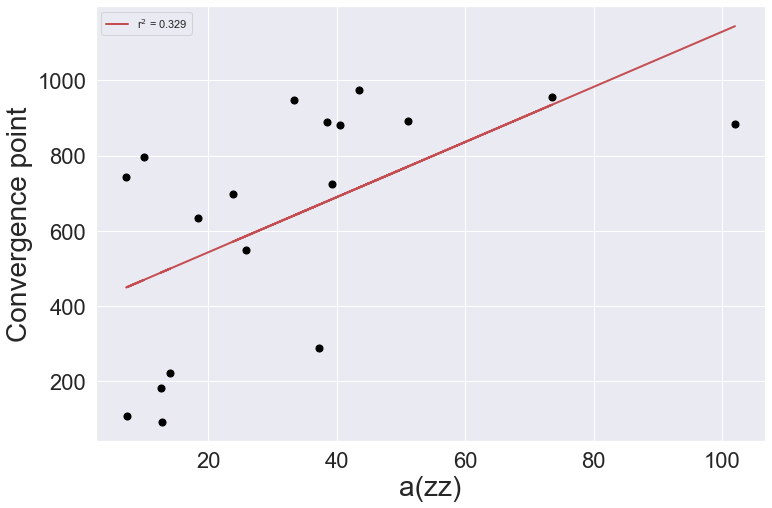

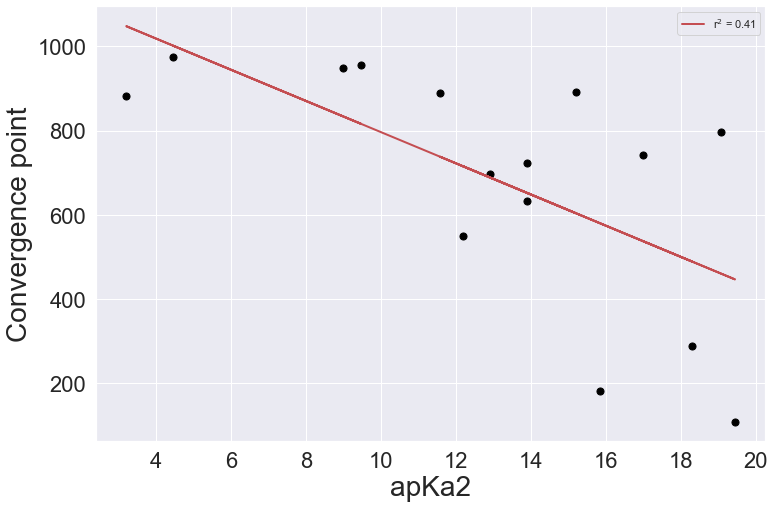

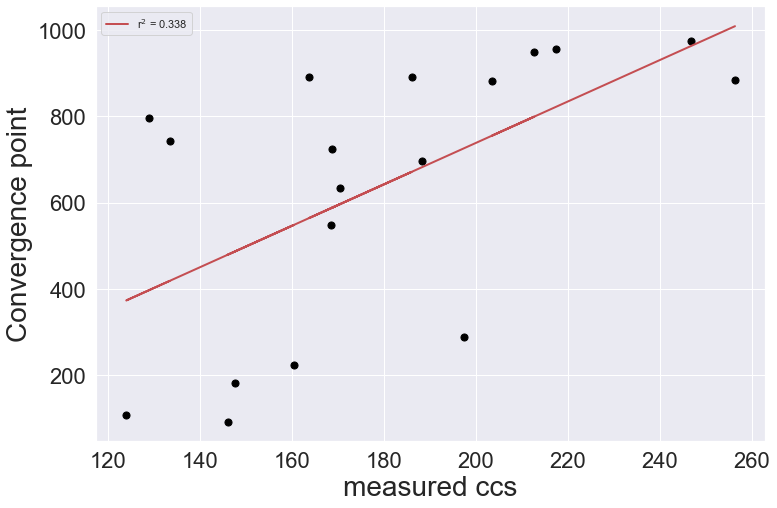

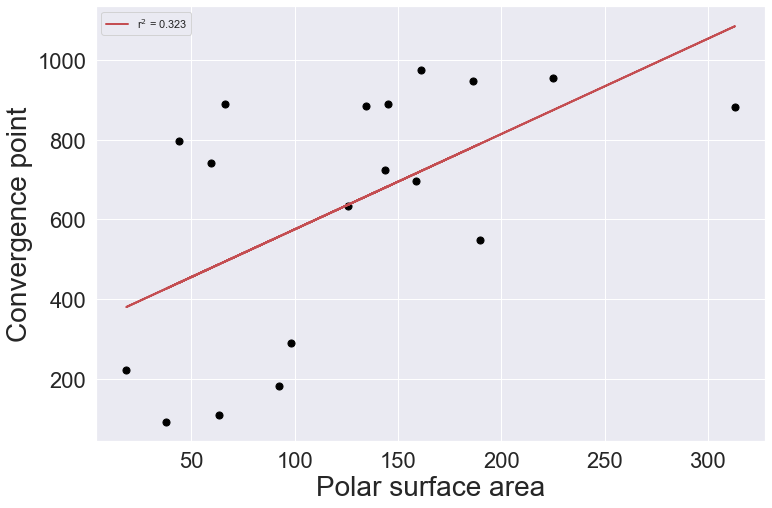

In [11]:
# Normalizes ranges from 0 to 1. This allows slopes to be more meanignnful and be compared across properties. 
# Also replaces 'Largest ring size' and 'Smallest ring size' 0's with np.nan

for i, xcol in enumerate(CXCALCdf.columns[[4,9,68,70,32]]):
    
    # First replace 0's from ring sizes with nan's
    CXCALCdf['Largest ring size'].replace(0, np.nan, inplace=True)
    CXCALCdf['Smallest ring size'].replace(0, np.nan, inplace=True)
    
    try:
        x = CXCALCdf[xcol].astype(float)
        
        # Normalize
        #x -= x.min()
        #x /= x.max()
        
    except:
        continue
    
    a = 12
    b = np.ceil(a*1.61803398875 - a)
    fig = plt.figure(figsize=(a,b))
    
    
    ####------
    ax2 = plt.subplot(1,1,1)
    ycol = 'RMSD converg sample size'
    y = MCdf[ycol].astype(int)

    plt.scatter(x, y , s=50, c='black')
    plt.title('', fontsize=27)
    plt.xlabel(xcol, fontsize=28)
    plt.ylabel('Convergence point', fontsize=28)

    plt.tick_params(axis='both', which='major', labelsize=22)
    ax2.yaxis.set_major_formatter(FormatStrFormatter('%0.0f'))
    
    # Plot the Linear regression line
    x_x = x.values
    y_y = y.values
    mask = ~np.isnan(x_x) & ~np.isnan(y_y)    
    lr = linregress(x_x[mask], y_y[mask])
    m = lr[0]
    r2 = lr[2]**2
    pval = lr[3]

    # Linear regression
    x_vals = x_x[mask].reshape(-1, 1)
    y_vals = y_y[mask].reshape(-1, 1)
    linear_regressor = LinearRegression()  # create object for the class
    linear_regressor.fit(x_vals, y_vals)  # perform linear regression
    y_pred = linear_regressor.predict(x_vals)     
    
    plt.plot(x_vals, y_pred, color='r', linestyle='-', linewidth=2,
             label=f'r$^2$ = {np.round(r2, decimals=3)}') #\n m = {np.round(m, decimals=3)}
    plt.legend() 
    
    #plt.savefig(f'rmsd-MC-{i+1}', dpi=600)
    plt.show()

## Slope vs log_10 of the p-value

In [12]:
df = pd.DataFrame(pears, columns=['Pval CV', 'Slope CV', 'Pval CR', 'Slope CR', 'Pval MS', 'Slope MS', ])
df

,Pval CV,Slope CV,Pval CR,Slope CR,Pval MS,Slope MS
0,8.682151e-01,0.028536,0.221815,-0.290868,0.883540,-0.028301
1,4.150140e-02,0.427785,0.841240,0.063589,0.932601,-0.021290
2,8.388643e-02,-0.530111,0.840867,0.080150,0.546316,-0.177790
3,7.095075e-01,0.094782,0.414560,0.291734,0.471339,0.204603
4,3.713291e-05,0.700012,0.012382,0.700602,0.001638,0.662302
5,9.137549e-06,0.800867,0.031563,0.679939,0.003954,0.683361
6,5.817558e-06,0.811470,0.027789,0.695389,0.005205,0.669247
7,4.670899e-04,0.592122,0.070301,0.495873,0.007118,0.550009
8,4.652597e-04,0.628489,0.113639,0.465574,0.014488,0.540425
9,4.866956e-06,0.833289,0.012818,0.788161,0.014210,0.617087


[]

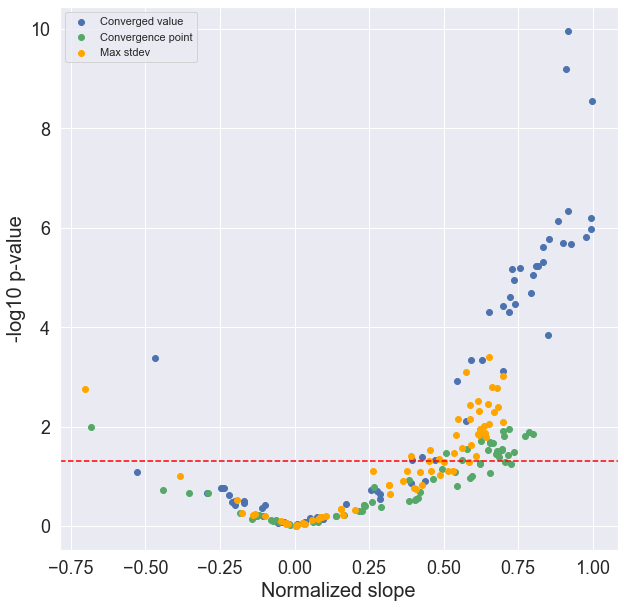

In [13]:
# Volcano plot

plt.figure(1, figsize=(10, 10))
ax = plt.subplot(1,1,1)

plt.scatter(df['Slope CV'], -np.log10(df['Pval CV']), c='b', label='Converged value')
plt.scatter(df['Slope CR'], -np.log10(df['Pval CR']), c='g', label='Convergence point')
plt.scatter(df['Slope MS'], -np.log10(df['Pval MS']), c='orange', label='Max stdev')

plt.xlabel('Normalized slope', fontsize=20) 
plt.ylabel('-log10 p-value', fontsize=20) #28
plt.tick_params(axis='both', which='major', labelsize=18)
plt.legend()

ax.axhline(-np.log10(0.05), linestyle='--', c='red')

# for i, slope in enumerate(df['Slope CV']):
#     ax.annotate(i, (df['Slope CV'][i], df['Pval CR'][i]))

plt.plot()
#plt.savefig('rmsd-properties-volcano-plot.png',bbox_inches='tight', dpi=600)

<IPython.core.display.Javascript object>


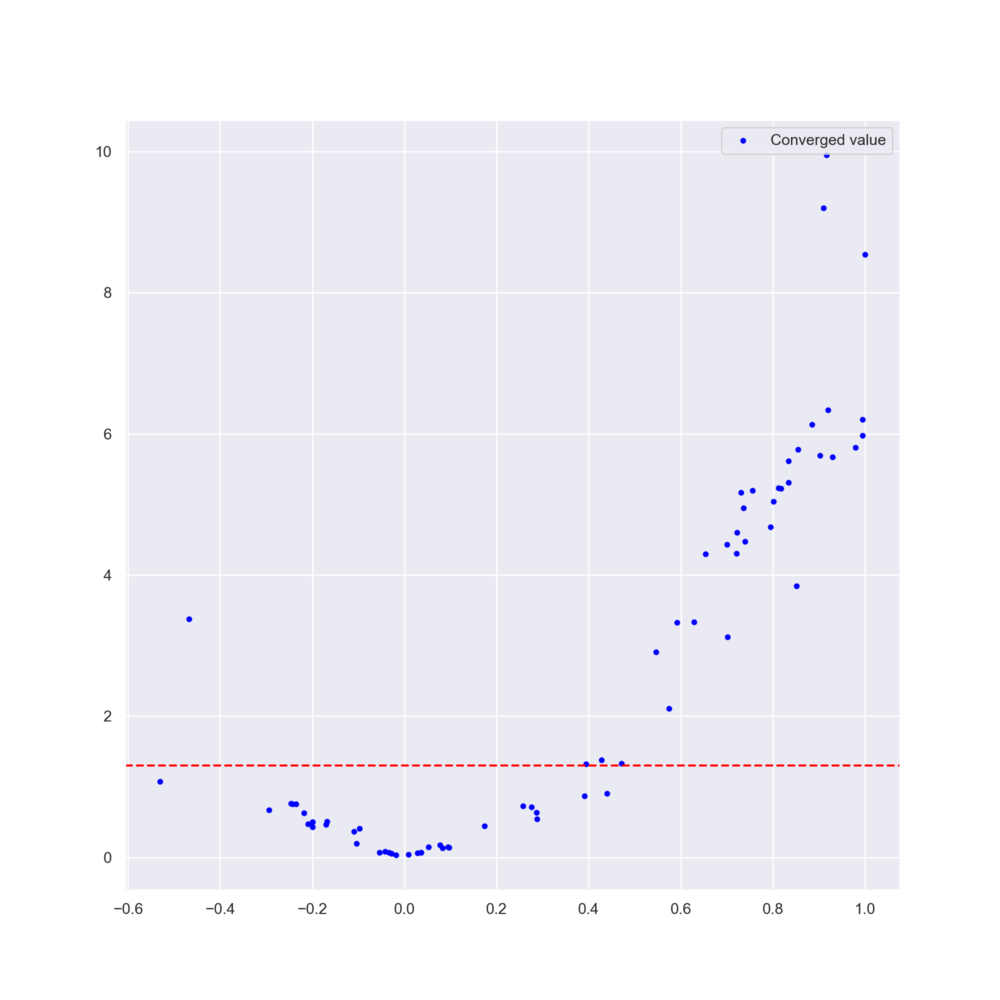

In [16]:
# Volcano plot with interactive data point labels

%matplotlib notebook

def update_annot(ind):

    pos = sc.get_offsets()[ind['ind'][0]]
    annot.xy = pos
    text = '{}, {}'.format(' '.join(list(map(str,ind['ind']))), 
                           ' '.join([names[n] for n in ind['ind']]))
    annot.set_text(text)
    annot.get_bbox_patch().set_facecolor(cmap(norm(c[ind['ind'][0]])))
    annot.get_bbox_patch().set_alpha(0.4)


def hover(event):
    vis = annot.get_visible()
    if event.inaxes == ax:
        cont, ind = sc.contains(event)
        if cont:
            update_annot(ind)
            annot.set_visible(True)
            fig.canvas.draw_idle()
        else:
            if vis:
                annot.set_visible(False)
                fig.canvas.draw_idle()

fig, ax = plt.subplots(figsize=(10,10))
norm = plt.Normalize(1,4)
cmap = plt.cm.RdYlGn

## Converged value
x = df['Slope CV']
y = -np.log10(df['Pval CV'])
names = CXCALCdf.columns.values
c = [2]*len(names)
ssize = 10

sc = plt.scatter(x, y, c='blue', s=ssize, label='Converged value') #, cmap=cmap, norm=norm)
annot = ax.annotate('', xy=(0,0), xytext=(6,8), textcoords='offset points',
                    bbox=dict(boxstyle='round', fc='w'))
annot.set_visible(False)
fig.canvas.mpl_connect("motion_notify_event", hover)

# Uncomment to plot
# ## Convergence point
# x = df['Slope CR']
# y = -np.log10(df['Pval CR'])
# c = [3]*len(names)

# sc = plt.scatter(x, y, c='red', s=ssize, label='Convergence point') #, cmap=cmap, norm=norm)
# annot = ax.annotate('', xy=(0,0), xytext=(6,8), textcoords='offset points',
#                     bbox=dict(boxstyle='round', fc='w'))
# annot.set_visible(False)
# fig.canvas.mpl_connect('motion_notify_event', hover)

# Uncomment to plot
# ## Max stdev
# x = df['Slope MS']
# y = -np.log10(df['Pval MS'])
# c = [3]*len(names)

# sc = plt.scatter(x, y, c='green', s=ssize, label='Max stdev') #, cmap=cmap, norm=norm)
# annot = ax.annotate('', xy=(0,0), xytext=(6,8), textcoords='offset points',
#                     bbox=dict(boxstyle='round', fc='w'))
# annot.set_visible(False)
# #fig.canvas.mpl_connect('motion_notify_event', hover)

plt.legend()
ax.axhline(-np.log10(0.05), linestyle='--', c='red')
plt.show()